<a href="https://colab.research.google.com/github/Thomas-Fabbris/applied-statistics-polimi/blob/main/Labs/Lab_VII_2026.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

**<font size="5">Applied Statistics</font>**

<font size="3">MSc in High Performance Computing Engineering, Computer Science and Engineering, Physics Engineering, ... cod 062102</font>

A.Y. 2025-2026

Prof. Michela Carlotta Massi - Dott. Vittorio Torri

---

<font size="4">**Lab VII - Feature Selection, Cross Validation, Shrinkage, KNN, Tree-based methods**</font>

# Libraries

In [ ]:
import pandas as pd
pd.options.display.float_format = '{:.2f}'.format

In [ ]:
from sklearn.pipeline import Pipeline
from sklearn.compose import ColumnTransformer
from sklearn.linear_model import LinearRegression
from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.linear_model import Ridge, Lasso
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.metrics import r2_score, mean_squared_error, mean_absolute_error
import numpy as np
import matplotlib.pyplot as plt

In [ ]:
from sklearn.datasets import load_iris
from sklearn.model_selection import train_test_split, StratifiedKFold, cross_val_score
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, roc_auc_score, classification_report, confusion_matrix, ConfusionMatrixDisplay

In [ ]:
import statsmodels.api as sm

In [ ]:
np.random.seed(1234)

In [ ]:
import scipy.stats as stats

# Load Dataset

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
PATH = '/content/drive/MyDrive/_Polimi/StatAppHPC' #adjust
df = pd.read_csv(PATH + '/heart_failure_clinical_records_dataset_smhd.csv')

In [ ]:
df

,age,anaemia,creatinine_phosphokinase,diabetes,ejection_fraction,high_blood_pressure,platelets,serum_creatinine,serum_sodium,sex,smoking,time,DEATH_EVENT,bmi
0,75.00,0,582,0,20.73,1,265000.00,1.90,138.39,Male,0,4,True,30.82
1,55.00,0,7861,0,29.02,0,263358.03,1.10,131.90,Male,0,6,True,25.40
2,65.00,0,146,0,26.24,0,162000.00,1.30,143.66,Male,1,7,True,29.45
3,50.00,1,111,0,10.21,0,210000.00,1.90,135.03,Male,0,7,True,36.06
4,65.00,1,160,1,19.33,0,327000.00,2.70,136.08,Female,0,8,True,33.69
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
294,62.00,0,61,1,38.05,1,155000.00,1.10,135.58,Male,1,270,False,25.60
295,55.00,0,1820,0,35.20,0,270000.00,1.20,142.02,Female,0,271,False,29.39
296,45.00,0,2060,1,62.32,0,742000.00,0.80,136.38,Female,0,278,False,20.71
297,45.00,0,2413,0,37.49,0,140000.00,1.40,133.91,Male,1,280,False,27.76


In [ ]:
cat_vars = ['anaemia', 'diabetes', 'high_blood_pressure',  'sex',  'smoking',  'DEATH_EVENT']
num_vars = ['age', 'creatinine_phosphokinase', 'ejection_fraction', 'platelets', 'serum_creatinine', 'serum_sodium', 'bmi', 'time']#, 'rehospitalizations']

# Wrapper Feature selection

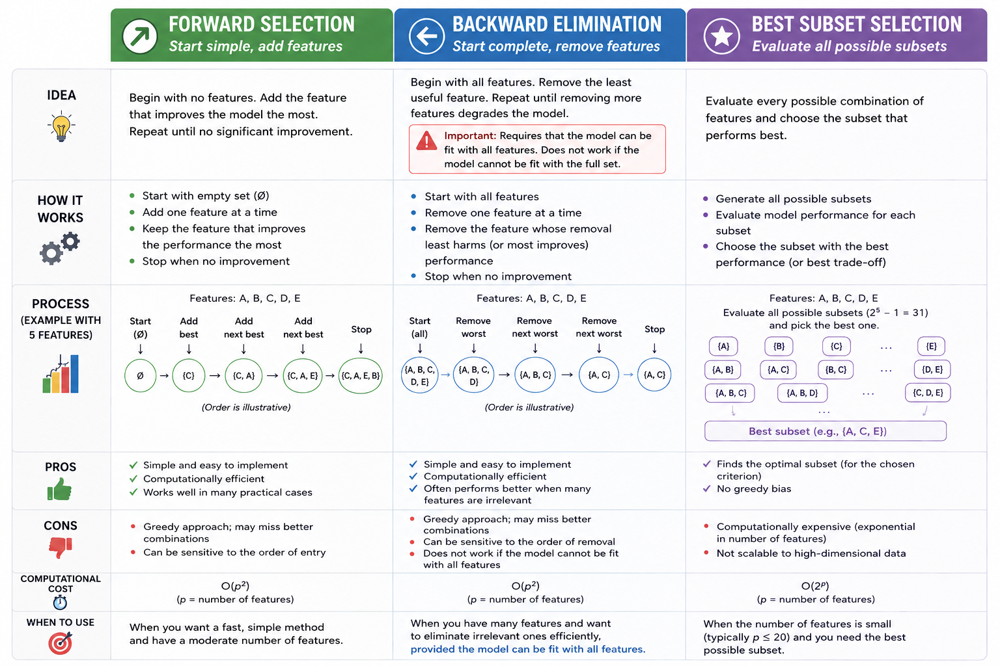

## Linear Regression for ejection fraction

Let's build a linear regression model for ejection fraction and try to experiment with different wrapper feature selection methods

In [ ]:
import time
from sklearn.pipeline import Pipeline
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.linear_model import LinearRegression
from sklearn.feature_selection import SequentialFeatureSelector
from sklearn.metrics import mean_squared_error
from mlxtend.feature_selection import ExhaustiveFeatureSelector

X = df[['age', 'anaemia', 'creatinine_phosphokinase', 'diabetes', 'high_blood_pressure',
        'platelets', 'serum_creatinine', 'serum_sodium', 'sex', 'smoking', 'bmi', 'time',
        'DEATH_EVENT']]
y = df['ejection_fraction']

numeric_vars = num_vars.copy()
numeric_vars.remove('ejection_fraction')
categorical_vars = cat_vars.copy()

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=123)

# Preprocessing
preprocessor = ColumnTransformer([
    ('num', StandardScaler(), numeric_vars),
    ('cat', OneHotEncoder(drop='first', sparse_output=False), categorical_vars)
])

X_train_proc  = preprocessor.fit_transform(X_train)
X_test_proc = preprocessor.transform(X_test)
feature_names = preprocessor.get_feature_names_out()
n = len(y_test)

# Helper for metrics computation
def get_model_stats(y_true, y_pred, p, mse_full):
    n = len(y_true)
    rss = np.sum((y_true - y_pred) ** 2)
    mse = rss / n
    r2 = 1 - (rss / np.sum((y_true - np.mean(y_true)) ** 2))
    adj_r2 = 1 - ((1 - r2) * (n - 1)) / (n - p - 1)
    aic = n * np.log(mse) + 2 * p
    bic = n * np.log(mse) + p * np.log(n)
    cp = rss / mse_full - n + 2 * p
    return aic, bic, cp, adj_r2


# Full model (OLS)
start = time.time()
ols_model = LinearRegression().fit(X_train_proc, y_train)
train_rss_full = np.sum((y_train - ols_model.predict(X_train_proc)) ** 2)
mse_full = train_rss_full / len(y_train)
y_pred_ols = ols_model.predict(X_test_proc)
aic_ols, bic_ols, cp_ols, adj_r2_ols = get_model_stats(y_test, y_pred_ols, X_test_proc.shape[1] + 1, mse_full)
time_ols = time.time() - start

# Best Subset Selection
start = time.time()
efs = ExhaustiveFeatureSelector(LinearRegression(), min_features=1, max_features=10, scoring='r2', cv=None)
efs.fit(X_train_proc, y_train)
best_subset_idx = list(efs.best_idx_)
model_best = LinearRegression().fit(X_train_proc[:, best_subset_idx], y_train)
y_pred_best = model_best.predict(X_test_proc[:, best_subset_idx])
aic_best, bic_best, cp_best, adj_r2_best = get_model_stats(y_test, y_pred_best, len(best_subset_idx) + 1, mse_full)
time_best = time.time() - start

# Forward Selection
start = time.time()
sfs_forward = SequentialFeatureSelector(LinearRegression(), direction='forward', cv=None, scoring='r2')
sfs_forward.fit(X_train_proc, y_train)
fmask = sfs_forward.get_support()
model_fwd = LinearRegression().fit(X_train_proc[:, fmask], y_train)
y_pred_fwd = model_fwd.predict(X_test_proc[:, fmask])
aic_fwd, bic_fwd, cp_fwd, adj_r2_fwd = get_model_stats(y_test, y_pred_fwd, sum(fmask) + 1, mse_full)
time_fwd = time.time() - start

# Backward Selection
start = time.time()
sfs_backward = SequentialFeatureSelector(LinearRegression(), direction='backward', cv=None, scoring='r2')
sfs_backward.fit(X_train_proc, y_train)
bmask = sfs_backward.get_support()
model_bwd = LinearRegression().fit(X_train_proc[:, bmask], y_train)
y_pred_bwd = model_bwd.predict(X_test_proc[:, bmask])
aic_bwd, bic_bwd, cp_bwd, adj_r2_bwd = get_model_stats(y_test, y_pred_bwd, sum(bmask) + 1, mse_full)
time_bwd = time.time() - start

# Compile metrics
metrics_df = pd.DataFrame([
    {'Model': 'OLS (All)', 'AIC': aic_ols, 'BIC': bic_ols, "Cp": cp_ols, 'Adj. R^2': adj_r2_ols, 'Time (s)': time_ols},
    {'Model': 'Best Subset', 'AIC': aic_best, 'BIC': bic_best, "Cp": cp_best, 'Adj. R^2': adj_r2_best, 'Time (s)': time_best},
    {'Model': 'Forward Selection', 'AIC': aic_fwd, 'BIC': bic_fwd, "Cp": cp_fwd, 'Adj. R^2': adj_r2_fwd, 'Time (s)': time_fwd},
    {'Model': 'Backward Selection', 'AIC': aic_bwd, 'BIC': bic_bwd, "Cp": cp_bwd, 'Adj. R^2': adj_r2_bwd, 'Time (s)': time_bwd}
])



# Display
print("\n\nModel Comparison (AIC, BIC, Cp, Time):")
print(metrics_df)

print("\nSelected Features:")
print('Best subset:\n')
print(feature_names[best_subset_idx])
print('\nForward selection:\n')
print(feature_names[fmask])
print('\nBackward selection:\n')
print(feature_names[bmask])


Features: 8099/8099



Model Comparison (AIC, BIC, Cp, Time):
                Model    AIC    BIC    Cp  Adj. R^2  Time (s)
0           OLS (All) 284.16 313.49 34.99      0.29      0.03
1         Best Subset 277.99 301.02 28.79      0.34     43.02
2   Forward Selection 270.79 285.45 21.69      0.38      1.39
3  Backward Selection 271.87 288.62 22.66      0.38      1.40

Selected Features:
Best subset:

['num__age' 'num__creatinine_phosphokinase' 'num__serum_creatinine'
 'num__serum_sodium' 'num__bmi' 'num__time' 'cat__anaemia_1'
 'cat__high_blood_pressure_1' 'cat__sex_Male' 'cat__DEATH_EVENT_True']

Forward selection:

['num__age' 'num__platelets' 'num__serum_creatinine' 'num__serum_sodium'
 'num__bmi' 'cat__DEATH_EVENT_True']

Backward selection:

['num__age' 'num__platelets' 'num__serum_creatinine' 'num__serum_sodium'
 'num__bmi' 'cat__sex_Male' 'cat__DEATH_EVENT_True']


# Cross-validation

Instead of simple train-test split, CV is a more robust methods to evaluate and select models.

While conceptually simple, it is important to pay attention to data leackages!

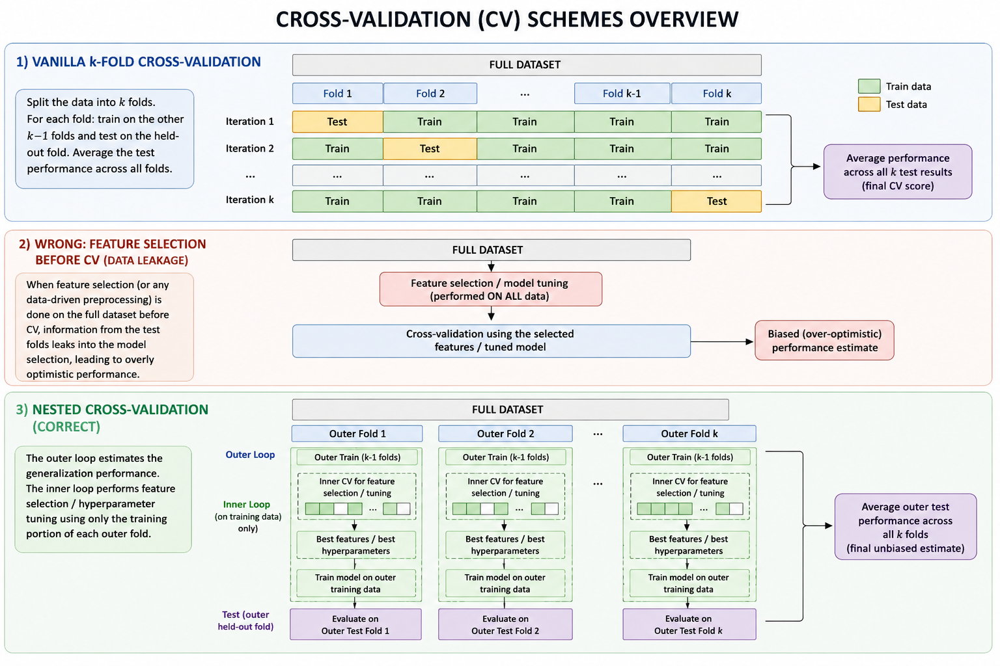

In [ ]:
from sklearn.model_selection import KFold, cross_val_score


# -----------------------
# Data
# -----------------------

X = df[['age', 'anaemia', 'creatinine_phosphokinase', 'diabetes',
        'high_blood_pressure', 'platelets', 'serum_creatinine',
        'serum_sodium', 'sex', 'smoking', 'bmi', 'time',
        'DEATH_EVENT']]

y = df['ejection_fraction']

numeric_vars = num_vars.copy()
numeric_vars.remove('ejection_fraction')

categorical_vars = cat_vars.copy()


# -----------------------
# Pipeline: preprocessing + model
# -----------------------

preprocessor = ColumnTransformer([
    ('num', StandardScaler(), numeric_vars),
    ('cat', OneHotEncoder(drop='first', sparse_output=False, handle_unknown='ignore'), categorical_vars)
])

model = Pipeline([
    ('preprocess', preprocessor),
    ('regressor', LinearRegression())
])


# -----------------------
# 10-fold cross-validation
# -----------------------

cv = KFold(
    n_splits=10,
    shuffle=True,
    random_state=123
)

r2_scores = cross_val_score(
    model,
    X,
    y,
    cv=cv,
    scoring='r2'
)


# -----------------------
# Results
# -----------------------

print("10-fold CV R² scores:")
print(r2_scores)

print("\nMean R²:")
print(r2_scores.mean())

print("\nSD R²:")
print(r2_scores.std())

10-fold CV R² scores:
[0.45713947 0.49036347 0.62740461 0.50414251 0.48527475 0.31313418
 0.48921814 0.51035848 0.68374067 0.37091526]

Mean R²:
0.49316915400354977

SD R²:
0.10173253982087607


The extreme case of CV is Leave-One-Out, a CV where k=n

But there is an issue with LOO: R^2 cannot be computed on a single sample in the test fold (the denominator would be 0)

We can use the (R)MSE or the MAE, with one caveat: scikit-learn likes to maximize metrics, but errors like MSE need to be minimized. So it uses the negative MSE and convert it back to MSE with a - in front of it. Thsi is true also here where we are only computing MSE to evaluate the model, we are not optimizing anything based on it.

In [ ]:
from sklearn.model_selection import LeaveOneOut

loo = LeaveOneOut()

rmse_scores = -cross_val_score(
    model,
    X,
    y,
    cv=loo,
    scoring='neg_root_mean_squared_error'
)

print("Mean RMSE:", rmse_scores.mean())
print("SD RMSE:", rmse_scores.std())

Mean RMSE: 6.719114611606531
SD RMSE: 5.358019035239107


## Pipeline for wrapper feature selection with CV

Let's fit a CV pipeline including the pre-processing, the feature selection and a logistic regression model on death.

NB: the feature selection here requires to set the *n_features_to_select* parameter so as to be runned automatically. You can specifiy a number or "auto".


If *auto*, the behaviour depends on the *tol* parameter:

  -> if *tol* is not *None*, then features are selected while the score change does not exceed tol. The score depends on the *scoring* parameters (default R^2 for regression, accuracy for classification)

  -> otherwise, half of the features are selected.

If integer, the parameter is the absolute number of features to select.

If float between 0 and 1, it is the fraction of features to select.

In [ ]:
from sklearn.model_selection import train_test_split, StratifiedKFold, cross_validate
from sklearn.pipeline import Pipeline
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.linear_model import LogisticRegression
from sklearn.feature_selection import SequentialFeatureSelector
from sklearn.metrics import accuracy_score, log_loss, make_scorer

from mlxtend.feature_selection import ExhaustiveFeatureSelector

⚠️ **The next cell can take ~ 16 minutes to run!**

In [ ]:
# -----------------------
# Data
# -----------------------

features = [
    'age', 'anaemia', 'creatinine_phosphokinase', 'diabetes',
    'high_blood_pressure', 'platelets', 'serum_creatinine',
    'serum_sodium', 'sex', 'smoking', 'bmi', 'time',
    'ejection_fraction'
]

X = df[features]
y = df['DEATH_EVENT']

numeric_vars = [v for v in num_vars if v in features]
categorical_vars = [v for v in cat_vars if v in features and v != 'DEATH_EVENT']


# -----------------------
# Hold-out test split
# -----------------------

X_train, X_test, y_train, y_test = train_test_split(
    X, y,
    test_size=0.2,
    random_state=123,
    stratify=y
)


# -----------------------
# Preprocessing
# -----------------------

preprocessor = ColumnTransformer(
    transformers=[
        ('num', StandardScaler(), numeric_vars),
        ('cat', OneHotEncoder(drop='first', sparse_output=False, handle_unknown='ignore'), categorical_vars)
    ]
)

base_logreg = LogisticRegression(max_iter=1000, solver='lbfgs')


# -----------------------
# Pipelines
# -----------------------

full_pipe = Pipeline([
    ('preprocess', preprocessor),
    ('model', base_logreg)
])

best_subset_pipe = Pipeline([
    ('preprocess', preprocessor),
    ('select', ExhaustiveFeatureSelector(
        estimator=LogisticRegression(max_iter=1000),
        min_features=1,
        max_features=10,
        scoring='accuracy',
        cv=5,
        n_jobs=-1
    )),
    ('model', LogisticRegression(max_iter=1000))
])

forward_pipe = Pipeline([
    ('preprocess', preprocessor),
    ('select', SequentialFeatureSelector(
        estimator=LogisticRegression(max_iter=1000),
        direction='forward',
        n_features_to_select=10,
        scoring='accuracy',
        cv=5,
        n_jobs=-1
    )),
    ('model', LogisticRegression(max_iter=1000))
])

backward_pipe = Pipeline([
    ('preprocess', preprocessor),
    ('select', SequentialFeatureSelector(
        estimator=LogisticRegression(max_iter=1000),
        direction='backward',
        n_features_to_select=10,
        scoring='accuracy',
        cv=5,
        n_jobs=-1
    )),
    ('model', LogisticRegression(max_iter=1000))
])

pipelines = {
    'Full Logistic': full_pipe,
    'Best Subset': best_subset_pipe,
    'Forward Selection': forward_pipe,
    'Backward Selection': backward_pipe
}


# -----------------------
# Cross-validation on training set only
# -----------------------

cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=123)

scoring = {
    'accuracy': 'accuracy',
    'neg_log_loss': 'neg_log_loss'
}

cv_results = []

for name, pipe in pipelines.items():
    start = time.time()

    scores = cross_validate(
        pipe,
        X_train,
        y_train,
        cv=cv,
        scoring=scoring,
    )

    elapsed = time.time() - start

    cv_results.append({
        'Model': name,
        'CV Accuracy Mean': scores['test_accuracy'].mean(),
        'CV Accuracy SD': scores['test_accuracy'].std(),
        'CV LogLoss Mean': -scores['test_neg_log_loss'].mean(),
        'CV LogLoss SD': scores['test_neg_log_loss'].std(),
        'CV Time (s)': elapsed
    })

cv_results_df = pd.DataFrame(cv_results)

print("Cross-validation results on training set:")
print(cv_results_df)

Features: 8099/8099

Cross-validation results on training set:
                Model  CV Accuracy Mean  CV Accuracy SD  CV LogLoss Mean  \
0       Full Logistic              0.80            0.07             0.43   
1         Best Subset              0.82            0.07             0.46   
2   Forward Selection              0.83            0.08             0.43   
3  Backward Selection              0.82            0.07             0.43   

   CV LogLoss SD  CV Time (s)  
0           0.11         0.18  
1           0.12       934.41  
2           0.11        18.31  
3           0.11         8.40  


In [ ]:
# -----------------------
# Final test-set evaluation: selected pipeline only
# -----------------------

selected_name = "Forward Selection"
selected_pipe = forward_pipe

start = time.time()

selected_pipe.fit(X_train, y_train)

y_prob = selected_pipe.predict_proba(X_test)[:, 1]
y_pred = selected_pipe.predict(X_test)

elapsed = time.time() - start

test_results = [{
    "Model": selected_name,
    "Test Accuracy": accuracy_score(y_test, y_pred),
    "Test LogLoss": log_loss(y_test, y_prob),
    "N Selected Features": selected_pipe.named_steps["select"].get_support().sum(),
    "Final Fit Time (s)": elapsed
}]

test_results_df = pd.DataFrame(test_results)

print("\nFinal test-set results:")
print(test_results_df)

ValueError: Specifying the columns using strings is only supported for dataframes.

# Penalized Linear Regression

Ridge Regression:

$$
\hat{\beta} = \underset{\beta}{\arg \min} \left( \sum_{i=1}^n (y_i - X_i \beta)^2 + \alpha \sum_{j=1}^p \beta_j^2 \right)
$$

Lasso Regression:
$$
\hat{\beta} = \underset{\beta}{\arg \min} \left( \sum_{i=1}^n (y_i - X_i \beta)^2 + \alpha \sum_{j=1}^p |\beta_j| \right)
$$

## Ridge vs Lasso vs OLS

Let's compare Ridge, Lasso and OLS on our linear regression model for ejection fraction

In [ ]:
# Define X and y
X = df[['age', 'anaemia', 'creatinine_phosphokinase', 'diabetes', 'high_blood_pressure',
        'platelets', 'serum_creatinine', 'serum_sodium', 'sex', 'smoking', 'bmi', 'time',
        'DEATH_EVENT']]
y = df['ejection_fraction']

# Feature groups
numeric_vars = num_vars.copy()
numeric_vars.remove('ejection_fraction')
categorical_vars = cat_vars.copy()

# Preprocessor
preprocessor = ColumnTransformer([
    ('num', StandardScaler(), numeric_vars),
    ('cat', OneHotEncoder(drop='first', sparse_output=False), categorical_vars)
])

# Pipelines
ols_pipeline = Pipeline([
    ('preprocessor', preprocessor),
    ('regressor', LinearRegression())
])

ridge_pipeline = Pipeline([
    ('preprocessor', preprocessor),
    ('regressor', Ridge(alpha=10))  # Tune alpha if needed
])

lasso_pipeline = Pipeline([
    ('preprocessor', preprocessor),
    ('regressor', Lasso(alpha=1.0))  # Tune alpha if needed
])

# Fit models for coefficient comparison
ols_pipeline.fit(X, y)
ridge_pipeline.fit(X, y)
lasso_pipeline.fit(X, y)

# Predictions (only for coefficient comparison, not performance)
y_pred_ols = ols_pipeline.predict(X)
y_pred_ridge = ridge_pipeline.predict(X)
y_pred_lasso = lasso_pipeline.predict(X)

# Feature names
feature_names = ridge_pipeline.named_steps['preprocessor'].get_feature_names_out()

# Coefficients
ols_coefs = ols_pipeline.named_steps['regressor'].coef_
ridge_coefs = ridge_pipeline.named_steps['regressor'].coef_
lasso_coefs = lasso_pipeline.named_steps['regressor'].coef_

# Intercepts
ols_intercept = ols_pipeline.named_steps['regressor'].intercept_
ridge_intercept = ridge_pipeline.named_steps['regressor'].intercept_
lasso_intercept = lasso_pipeline.named_steps['regressor'].intercept_

coef_df = pd.DataFrame({
    'Feature': ['Intercept'] + list(feature_names),
    'OLS': [ols_intercept] + list(ols_coefs),
    'Ridge': [ridge_intercept] + list(ridge_coefs),
    'Lasso': [lasso_intercept] + list(lasso_coefs)
})


print("Coefficient Comparison:")
print(coef_df)

Coefficient Comparison:
                          Feature    OLS  Ridge  Lasso
0                       Intercept  40.45  40.21  38.03
1                        num__age   0.55   0.61   0.00
2   num__creatinine_phosphokinase  -0.02  -0.09  -0.00
3                  num__platelets  -0.05  -0.01   0.00
4           num__serum_creatinine   8.34   7.37   5.48
5               num__serum_sodium  -0.73  -0.82  -0.03
6                        num__bmi -11.84 -10.84  -9.21
7                       num__time  -0.82  -0.67  -0.00
8                  cat__anaemia_1  -0.44  -0.31   0.00
9                 cat__diabetes_1   0.15   0.05   0.00
10     cat__high_blood_pressure_1  -1.45  -1.11  -0.00
11                  cat__sex_Male  -1.43  -1.35  -0.00
12                 cat__smoking_1  -0.05  -0.15  -0.00
13          cat__DEATH_EVENT_True  -2.62  -2.35  -0.00


Lasso shrinks some coefficients to 0: **embedded feature selection**

Here we just compared coefficients, but let's try to compare metrics in CV:

In [ ]:
scoring = {
    'r2': 'r2',
    'neg_mse': 'neg_mean_squared_error',
    'neg_mae': 'neg_mean_absolute_error'
}

cv_results_ols = cross_validate(ols_pipeline, X, y, cv=5, scoring=scoring)
cv_results_ridge = cross_validate(ridge_pipeline, X, y, cv=5, scoring=scoring)
cv_results_lasso = cross_validate(lasso_pipeline, X, y, cv=5, scoring=scoring)

def summarize_cv(cv_results, model_name):
    r2_mean = np.mean(cv_results['test_r2'])
    r2_sd = np.std(cv_results['test_r2'])

    mse_values = -cv_results['test_neg_mse']
    mse_mean = np.mean(mse_values)
    mse_sd = np.std(mse_values)

    mae_values = -cv_results['test_neg_mae']
    mae_mean = np.mean(mae_values)
    mae_sd = np.std(mae_values)

    return {
        'Model': model_name,
        'CV R² Mean': r2_mean,
        'CV R² SD': r2_sd,
        'CV MSE Mean': mse_mean,
        'CV MSE SD': mse_sd,
        'CV MAE Mean': mae_mean,
        'CV MAE SD': mae_sd
    }

metrics_cv_df = pd.DataFrame([
    summarize_cv(cv_results_ols, 'OLS'),
    summarize_cv(cv_results_ridge, 'Ridge'),
    summarize_cv(cv_results_lasso, 'Lasso')
])

print("\nCross-Validation Performance Metrics:")
print(metrics_cv_df)


Cross-Validation Performance Metrics:
   Model  CV R² Mean  CV R² SD  CV MSE Mean  CV MSE SD  CV MAE Mean  CV MAE SD
0    OLS        0.42      0.25        75.08      12.37         6.80       0.51
1  Ridge        0.44      0.20        74.28      11.46         6.86       0.45
2  Lasso        0.44      0.16        76.03      12.71         6.97       0.52


## CV for alpha

In [ ]:
from sklearn.model_selection import GridSearchCV

# -----------------------
# Data and features
# -----------------------

X = df[['age', 'anaemia', 'creatinine_phosphokinase', 'diabetes',
        'high_blood_pressure', 'platelets', 'serum_creatinine',
        'serum_sodium', 'sex', 'smoking', 'bmi', 'time',
        'DEATH_EVENT']]

y = df['ejection_fraction']

numeric_vars = num_vars.copy()
numeric_vars.remove('ejection_fraction')

categorical_vars = cat_vars.copy()

# -----------------------
# Train/test split
# -----------------------

X_train, X_test, y_train, y_test = train_test_split(
    X, y,
    test_size=0.2,
    random_state=123
)

# -----------------------
# Preprocessing
# -----------------------

preprocessor = ColumnTransformer([
    ('num', StandardScaler(), numeric_vars),
    ('cat', OneHotEncoder(
        drop='first',
        sparse_output=False,
        handle_unknown='ignore'
    ), categorical_vars)
])

# -----------------------
# Pipelines
# -----------------------

ols_pipeline = Pipeline([
    ('preprocessor', preprocessor),
    ('regressor', LinearRegression())
])

ridge_pipeline = Pipeline([
    ('preprocessor', preprocessor),
    ('regressor', Ridge())
])

lasso_pipeline = Pipeline([
    ('preprocessor', preprocessor),
    ('regressor', Lasso(max_iter=10000))
])

# -----------------------
# Alpha grids
# -----------------------

alpha_grid = np.logspace(-3, 3, 50) # from 10^{-3} to 10^{3} with 50 values

ridge_params = {
    'regressor__alpha': alpha_grid
}

lasso_params = {
    'regressor__alpha': alpha_grid
}

ridge_cv = GridSearchCV(
    ridge_pipeline,
    ridge_params,
    cv=5,
    scoring='r2'
)

lasso_cv = GridSearchCV(
    lasso_pipeline,
    lasso_params,
    cv=5,
    scoring='r2'
)

# -----------------------
# Fit models
# -----------------------

ols_pipeline.fit(X_train, y_train)
ridge_cv.fit(X_train, y_train)
lasso_cv.fit(X_train, y_train)

# -----------------------
# Best alphas
# -----------------------

print("Best alpha for Ridge:", ridge_cv.best_params_['regressor__alpha'])
print("Best alpha for Lasso:", lasso_cv.best_params_['regressor__alpha'])

# -----------------------
# Predictions on test set
# -----------------------

y_pred_ols = ols_pipeline.predict(X_test)
y_pred_ridge = ridge_cv.predict(X_test)
y_pred_lasso = lasso_cv.predict(X_test)

# -----------------------
# Evaluation function
# -----------------------

def evaluate(y_true, y_pred, model_name):
    return {
        'Model': model_name,
        'Test R²': r2_score(y_true, y_pred),
        'Test MSE': mean_squared_error(y_true, y_pred),
        'Test RMSE': np.sqrt(mean_squared_error(y_true, y_pred)),
        'Test MAE': mean_absolute_error(y_true, y_pred)
    }

# -----------------------
# Metrics comparison
# -----------------------

metrics_df = pd.DataFrame([
    evaluate(y_test, y_pred_ols, 'OLS'),
    evaluate(y_test, y_pred_ridge, 'Ridge'),
    evaluate(y_test, y_pred_lasso, 'Lasso')
])

print("\nModel Performance Comparison:")
print(metrics_df)

# -----------------------
# Coefficient comparison
# -----------------------

feature_names = (
    ols_pipeline
    .named_steps['preprocessor']
    .get_feature_names_out()
)

coef_df = pd.DataFrame({
    'Feature': ['Intercept'] + list(feature_names),
    'OLS': (
        [ols_pipeline.named_steps['regressor'].intercept_]
        + list(ols_pipeline.named_steps['regressor'].coef_)
    ),
    'Ridge': (
        [ridge_cv.best_estimator_.named_steps['regressor'].intercept_]
        + list(ridge_cv.best_estimator_.named_steps['regressor'].coef_)
    ),
    'Lasso': (
        [lasso_cv.best_estimator_.named_steps['regressor'].intercept_]
        + list(lasso_cv.best_estimator_.named_steps['regressor'].coef_)
    )
})

print("\nCoefficient Comparison:")
print(coef_df)

Best alpha for Ridge: 6.25055192527397
Best alpha for Lasso: 0.28117686979742307

Model Performance Comparison:
   Model  Test R²  Test MSE  Test RMSE  Test MAE
0    OLS     0.46     71.48       8.45      6.99
1  Ridge     0.47     70.40       8.39      6.94
2  Lasso     0.46     71.54       8.46      6.94

Coefficient Comparison:
                          Feature    OLS  Ridge  Lasso
0                       Intercept  40.37  40.18  38.46
1                        num__age   0.32   0.39   0.00
2   num__creatinine_phosphokinase  -0.39  -0.44  -0.26
3                  num__platelets   0.07   0.11   0.00
4           num__serum_creatinine   8.27   7.49   7.47
5               num__serum_sodium  -0.59  -0.66  -0.43
6                        num__bmi -12.03 -11.23 -11.48
7                       num__time  -0.51  -0.40   0.00
8                  cat__anaemia_1  -0.28  -0.16   0.00
9                 cat__diabetes_1  -0.04  -0.14  -0.00
10     cat__high_blood_pressure_1  -1.56  -1.28  -0.10
11     

### Nested CV

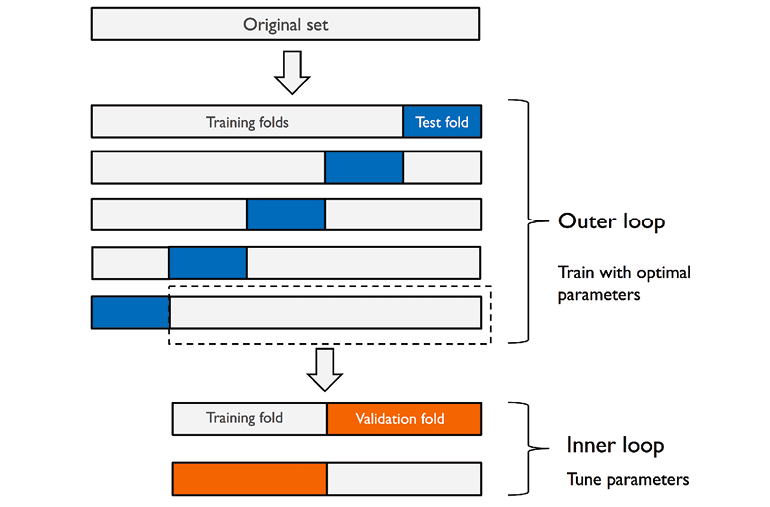

In [ ]:
# -----------------------
# Preprocessing
# -----------------------

preprocessor = ColumnTransformer([
    ('num', StandardScaler(), [col for col in num_vars if col != 'ejection_fraction']),
    ('cat', OneHotEncoder(drop='first', sparse_output=False, handle_unknown='ignore'), cat_vars)
])

# -----------------------
# Ridge search
# -----------------------

ridge_pipeline = Pipeline([
    ('preprocessor', preprocessor),
    ('regressor', Ridge())
])

ridge_params = {
    'regressor__alpha': np.logspace(-3, 3, 50)
}

ridge_nested = GridSearchCV(
    ridge_pipeline,
    ridge_params,
    cv=5,
    scoring='r2'
)

# -----------------------
# Lasso search
# -----------------------

lasso_pipeline = Pipeline([
    ('preprocessor', preprocessor),
    ('regressor', Lasso(max_iter=10000))
])

lasso_params = {
    'regressor__alpha': np.logspace(-3, 3, 50)
}

lasso_nested = GridSearchCV(
    lasso_pipeline,
    lasso_params,
    cv=5,
    scoring='r2'
)

# -----------------------
# Outer CV
# -----------------------

outer_cv = KFold(
    n_splits=5,
    shuffle=True,
    random_state=42
)

scoring = (
    'neg_mean_squared_error',
    'neg_mean_absolute_error',
    'r2'
)

# -----------------------
# Nested CV evaluation
# -----------------------

ridge_scores = cross_validate(
    ridge_nested,
    X,
    y,
    scoring=scoring,
    cv=outer_cv,
    return_estimator=True
)

lasso_scores = cross_validate(
    lasso_nested,
    X,
    y,
    scoring=scoring,
    cv=outer_cv,
    return_estimator=True
)

# -----------------------
# Summary function
# -----------------------

def summarize_nested_cv(name, scores):
    mse = -scores['test_neg_mean_squared_error']
    mae = -scores['test_neg_mean_absolute_error']
    r2 = scores['test_r2']

    print(f"\n{name} Nested Cross-Validation Results:")
    print(f"  MSE : Mean = {mse.mean():.3f}, SD = {mse.std():.3f}")
    print(f"  MAE : Mean = {mae.mean():.3f}, SD = {mae.std():.3f}")
    print(f"  R²  : Mean = {r2.mean():.3f}, SD = {r2.std():.3f}")

# -----------------------
# Print summaries
# -----------------------

summarize_nested_cv("Ridge", ridge_scores)
summarize_nested_cv("Lasso", lasso_scores)

# -----------------------
# Inspect selected alphas
# -----------------------

ridge_alphas = [
    est.best_params_['regressor__alpha']
    for est in ridge_scores['estimator']
]

lasso_alphas = [
    est.best_params_['regressor__alpha']
    for est in lasso_scores['estimator']
]

print("\nRidge selected alphas across outer folds:")
print(ridge_alphas)

print("\nLasso selected alphas across outer folds:")
print(lasso_alphas)


Ridge Nested Cross-Validation Results:
  MSE : Mean = 77.203, SD = 6.083
  MAE : Mean = 6.935, SD = 0.566
  R²  : Mean = 0.469, SD = 0.053

Lasso Nested Cross-Validation Results:
  MSE : Mean = 73.606, SD = 7.966
  MAE : Mean = 6.786, SD = 0.612
  R²  : Mean = 0.493, SD = 0.072

Ridge selected alphas across outer folds:
[np.float64(8.286427728546842), np.float64(25.595479226995334), np.float64(14.563484775012444), np.float64(14.563484775012444), np.float64(19.306977288832496)]

Lasso selected alphas across outer folds:
[np.float64(0.3727593720314938), np.float64(0.868511373751352), np.float64(0.655128556859551), np.float64(0.655128556859551), np.float64(0.49417133613238334)]


Then need to re-tune on the whole training set to get the a single, deployable best value of alpha

In [ ]:
final_lasso = GridSearchCV(
    lasso_pipeline,
    lasso_params,
    cv=5,
    scoring='r2'
)

final_lasso.fit(X, y)

GridSearchCV(cv=5,
             estimator=Pipeline(steps=[('preprocessor',
                                        ColumnTransformer(transformers=[('num',
                                                                         StandardScaler(),
                                                                         ['age',
                                                                          'creatinine_phosphokinase',
                                                                          'platelets',
                                                                          'serum_creatinine',
                                                                          'serum_sodium',
                                                                          'bmi',
                                                                          'time']),
                                                                        ('cat',
                                                                         OneHotEncoder(drop='first',
                                                                                       handle_unknown='ignore',
                                                                                       sparse_output=False),
                                                                         ['anaemia',
                                                                          'diabetes',
                                                                          'high_blood_pressure',
                                                                          'sex',
                                                                          'smoking',...
       8.68511374e-01, 1.15139540e+00, 1.52641797e+00, 2.02358965e+00,
       2.68269580e+00, 3.55648031e+00, 4.71486636e+00, 6.25055193e+00,
       8.28642773e+00, 1.09854114e+01, 1.45634848e+01, 1.93069773e+01,
       2.55954792e+01, 3.39322177e+01, 4.49843267e+01, 5.96362332e+01,
       7.90604321e+01, 1.04811313e+02, 1.38949549e+02, 1.84206997e+02,
       2.44205309e+02, 3.23745754e+02, 4.29193426e+02, 5.68986603e+02,
       7.54312006e+02, 1.00000000e+03])},
             scoring='r2')

In [ ]:
best_alpha = final_lasso.best_params_['regressor__alpha']
print(best_alpha)

0.49417133613238334


In [ ]:
print(final_lasso.best_score_)

0.4536701981814879


In [ ]:
# Feature names after preprocessing
feature_names = (
    final_lasso.best_estimator_
    .named_steps['preprocessor']
    .get_feature_names_out()
)

# Coefficients of the model with the best alpha
coefficients = (
    final_lasso.best_estimator_
    .named_steps['regressor']
    .coef_
)


coef_df = pd.DataFrame({
    'Feature': feature_names,
    'Coefficient': coefficients
})

coef_df

,Feature,Coefficient
0,num__age,0.00
1,num__creatinine_phosphokinase,-0.00
2,num__platelets,0.00
3,num__serum_creatinine,6.99
4,num__serum_sodium,-0.40
5,num__bmi,-10.75
6,num__time,-0.00
7,cat__anaemia_1,-0.00
8,cat__diabetes_1,0.00
9,cat__high_blood_pressure_1,-0.00


# K-Neareast Neighbour (KNN)

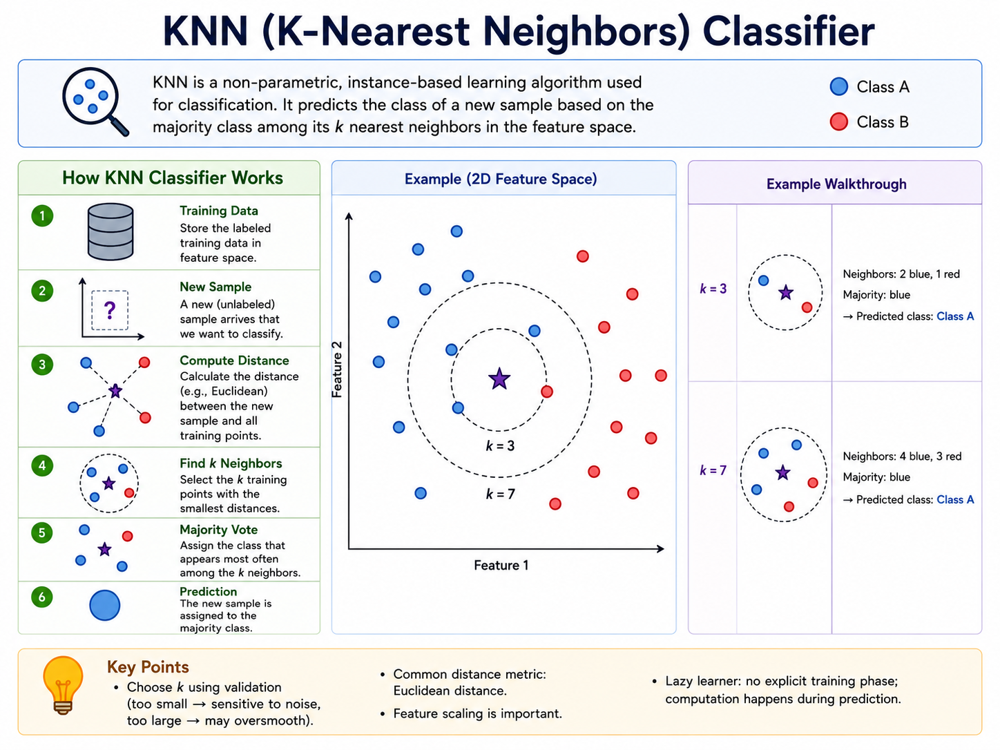

## Iris

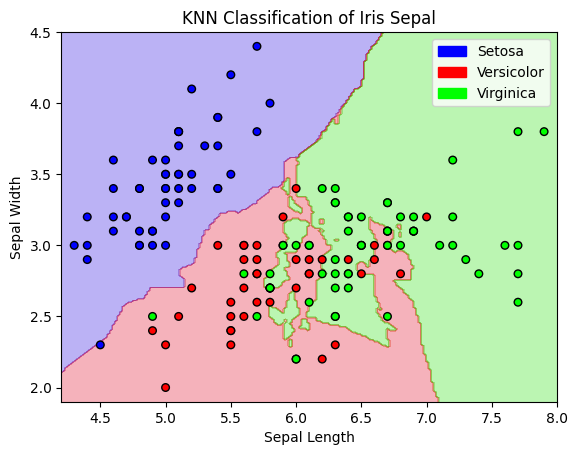

In [ ]:
from sklearn.neighbors import KNeighborsClassifier
import matplotlib.patches as mpatches

iris_data = load_iris()
X_iris = iris_data.data[:, :2]  # only Sepal.Length, Sepal.Width
y_iris = iris_data.target       # 0, 1, 2 for setosa, versicolor, virginica

# Train a KNN classifier
knn = KNeighborsClassifier(n_neighbors=5)  # Using 5 neighbors
knn.fit(X_iris, y_iris)

# Create a mesh grid to plot the decision boundary
x_min, x_max = X_iris[:, 0].min() - 0.1, X_iris[:, 0].max() + 0.1
y_min, y_max = X_iris[:, 1].min() - 0.1, X_iris[:, 1].max() + 0.1
xx, yy = np.meshgrid(np.linspace(x_min, x_max, 200),
                     np.linspace(y_min, y_max, 200))

# Predict the class for each point in the grid
Z = knn.predict(np.c_[xx.ravel(), yy.ravel()])
Z = Z.reshape(xx.shape)

# Plot the decision boundary
plt.figure()
plt.contourf(xx, yy, Z, alpha=0.3, cmap='brg')

# Plot the data points
plt.scatter(X_iris[:, 0], X_iris[:, 1], c=y_iris, cmap='brg', edgecolor='k', s=30)

# Legend for species
handles = [
    mpatches.Patch(color=plt.get_cmap("brg", 3)(0), label='Setosa'),
    mpatches.Patch(color=plt.get_cmap("brg", 3)(1), label='Versicolor'),
    mpatches.Patch(color=plt.get_cmap("brg", 3)(2), label='Virginica')
]
plt.legend(handles=handles, loc='upper right')

# Labels and title
plt.title("KNN Classification of Iris Sepal")
plt.xlabel("Sepal Length")
plt.ylabel("Sepal Width")
plt.show()

In [ ]:
from sklearn.metrics import confusion_matrix

y_pred = knn.predict(X_iris)

conf_matrix = confusion_matrix(y_iris, y_pred)

print("Train Confusion Matrix:")
print(conf_matrix)

Train Confusion Matrix:
[[49  1  0]
 [ 0 37 13]
 [ 0 10 40]]


## CV for KNN

Best k: 20
Mean CV macro-F1: 0.8372
SD CV macro-F1: 0.0483

Test Accuracy: 0.7555555555555555
Test Macro-F1: 0.7485714285714286


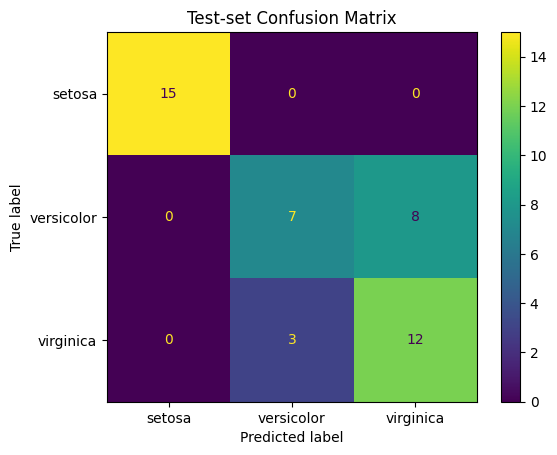

In [ ]:
from sklearn.neighbors import KNeighborsClassifier


# -----------------------
# Data
# -----------------------

iris_data = load_iris()

X_iris = iris_data.data[:, :2]   # Sepal length, sepal width
y_iris = iris_data.target

class_names = iris_data.target_names

# -----------------------
# Train/test split
# -----------------------

X_train, X_test, y_train, y_test = train_test_split(
    X_iris,
    y_iris,
    test_size=0.3,
    random_state=123,
    stratify=y_iris
)

# -----------------------
# Select k by CV on training set only
# -----------------------

cv = StratifiedKFold(
    n_splits=5,
    shuffle=True,
    random_state=42
)

k_range = range(1, 31)

mean_scores = []
sd_scores = []

for k in k_range:
    fold_scores = cross_val_score(
        KNeighborsClassifier(n_neighbors=k),
        X_train,
        y_train,
        cv=cv,
        scoring='f1_macro'
    )

    mean_scores.append(fold_scores.mean())
    sd_scores.append(fold_scores.std())

best_idx = np.argmax(mean_scores)
best_k = list(k_range)[best_idx]

print(f"Best k: {best_k}")
print(f"Mean CV macro-F1: {mean_scores[best_idx]:.4f}")
print(f"SD CV macro-F1: {sd_scores[best_idx]:.4f}")

# -----------------------
# Fit final model on full training set
# -----------------------

knn = KNeighborsClassifier(n_neighbors=best_k)
knn.fit(X_train, y_train)

# -----------------------
# Evaluate on test set
# -----------------------

y_pred = knn.predict(X_test)

print("\nTest Accuracy:", accuracy_score(y_test, y_pred))
print("Test Macro-F1:", f1_score(y_test, y_pred, average='macro'))

conf_matrix = confusion_matrix(y_test, y_pred)

ConfusionMatrixDisplay(
    confusion_matrix=conf_matrix,
    display_labels=class_names
).plot()

plt.title("Test-set Confusion Matrix")
plt.show()

Let's look at the behaviour at different k:

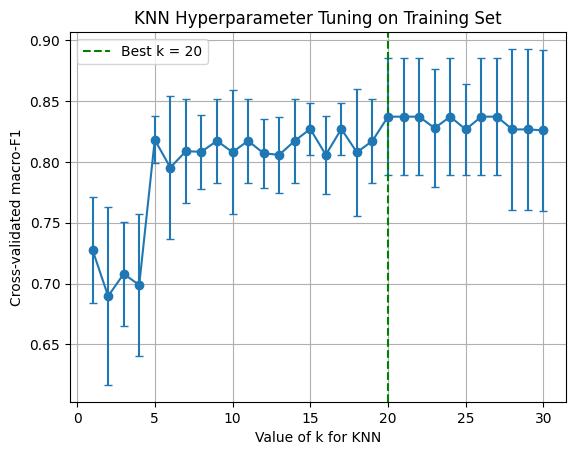

In [ ]:
plt.figure()
plt.errorbar(
    k_range,
    mean_scores,
    yerr=sd_scores,
    marker='o',
    capsize=3
)

plt.axvline(
    best_k,
    linestyle='--',
    label=f'Best k = {best_k}',
    color='green'
)

plt.xlabel('Value of k for KNN')
plt.ylabel('Cross-validated macro-F1')
plt.title('KNN Hyperparameter Tuning on Training Set')
plt.legend()
plt.grid(True)
plt.show()

What about decision boundaries? With k=20 they should be smoother than with k=5

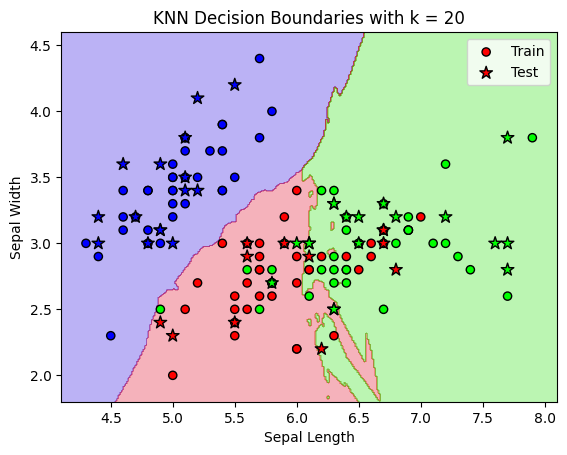

In [ ]:
x_min, x_max = X_iris[:, 0].min() - 0.2, X_iris[:, 0].max() + 0.2
y_min, y_max = X_iris[:, 1].min() - 0.2, X_iris[:, 1].max() + 0.2

xx, yy = np.meshgrid(
    np.linspace(x_min, x_max, 300),
    np.linspace(y_min, y_max, 300)
)

Z = knn.predict(np.c_[xx.ravel(), yy.ravel()])
Z = Z.reshape(xx.shape)

plt.figure()

plt.contourf(
    xx,
    yy,
    Z,
    alpha=0.3,
    cmap='brg'
)

plt.scatter(
    X_train[:, 0],
    X_train[:, 1],
    c=y_train,
    cmap='brg',
    edgecolor='k',
    s=35,
    label='Train'
)

plt.scatter(
    X_test[:, 0],
    X_test[:, 1],
    c=y_test,
    cmap='brg',
    edgecolor='k',
    s=90,
    marker='*',
    label='Test'
)

plt.xlabel("Sepal Length")
plt.ylabel("Sepal Width")
plt.title(f"KNN Decision Boundaries with k = {best_k}")
plt.legend()
plt.show()

## KNN Regressor

Here is an example of KNN as regressor. You can try to tune k.

Another variant is the `weight` parameter: `uniform` is the default, but `distance`, which gives more importance to closer nreighbors, is often better for regression.

In [ ]:
from sklearn.neighbors import KNeighborsRegressor
from sklearn.metrics import r2_score, mean_squared_error, mean_absolute_error


# -----------------------
# Features and target
# -----------------------

X = df.drop(columns='ejection_fraction')
y = df['ejection_fraction']

categorical_vars_model = [v for v in cat_vars if v in X.columns]
numeric_vars_model = [v for v in X.columns if v not in categorical_vars_model]


# -----------------------
# Preprocessing
# -----------------------

preprocessor = ColumnTransformer([
    ('cat', OneHotEncoder(
        drop='first',
        handle_unknown='ignore'
    ), categorical_vars_model),

    ('num', StandardScaler(), numeric_vars_model)
], verbose_feature_names_out=False)


# -----------------------
# Pipeline
# -----------------------

pipeline = Pipeline([
    ('preprocessor', preprocessor),
    ('regressor', KNeighborsRegressor(
        n_neighbors=5,
        weights='uniform'
    ))
])


# -----------------------
# Train/test split
# -----------------------

X_train, X_test, y_train, y_test = train_test_split(
    X,
    y,
    test_size=0.2,
    random_state=42
)


# -----------------------
# Fit model
# -----------------------

pipeline.fit(X_train, y_train)


# -----------------------
# Predictions
# -----------------------

y_pred = pipeline.predict(X_test)


# -----------------------
# Metrics
# -----------------------

r2 = r2_score(y_test, y_pred)
mse = mean_squared_error(y_test, y_pred)
rmse = np.sqrt(mse)
mae = mean_absolute_error(y_test, y_pred)

print(f"R² Score: {r2:.3f}")
print(f"MSE:      {mse:.3f}")
print(f"RMSE:     {rmse:.3f}")
print(f"MAE:      {mae:.3f}")

R² Score: 0.335
MSE:      115.802
RMSE:     10.761
MAE:      8.871


# Decision Trees

Train Accuracy: 0.98
Test Accuracy:  0.97
              precision    recall  f1-score   support

      setosa       1.00      1.00      1.00        10
  versicolor       1.00      0.90      0.95        10
   virginica       0.91      1.00      0.95        10

    accuracy                           0.97        30
   macro avg       0.97      0.97      0.97        30
weighted avg       0.97      0.97      0.97        30



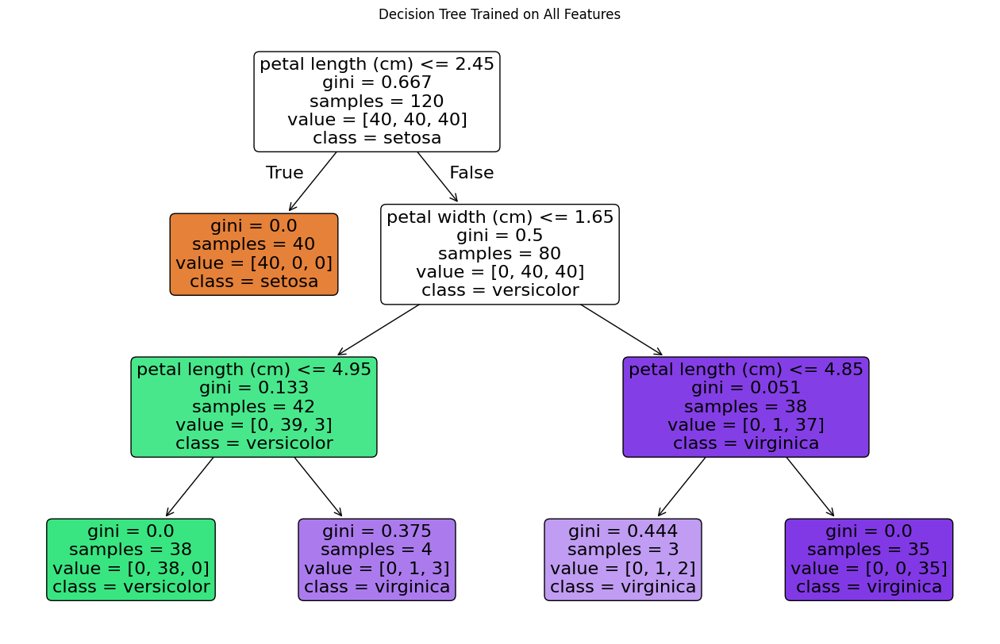

In [ ]:
from sklearn.datasets import load_iris
from sklearn.tree import DecisionTreeClassifier, plot_tree
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, classification_report

# Load data
iris = load_iris()
X = iris.data
y = iris.target
feature_names = iris.feature_names
target_names = iris.target_names

# Train/test split
X_train, X_test, y_train, y_test = train_test_split(X, y, stratify=y, random_state=42, test_size=0.2)

# Train decision tree using all features
clf = DecisionTreeClassifier(max_depth=3, random_state=42)
clf.fit(X_train, y_train)

# Evaluate
y_pred = clf.predict(X_test)
train_acc = accuracy_score(y_train, clf.predict(X_train))
test_acc = accuracy_score(y_test, y_pred)

print(f"Train Accuracy: {train_acc:.2f}")
print(f"Test Accuracy:  {test_acc:.2f}")
print(classification_report(y_test, y_pred, target_names=target_names))

# Tree Visualization
plt.figure(figsize=(16, 10))
plot_tree(clf, feature_names=feature_names, class_names=target_names, filled=True, rounded=True)
plt.title("Decision Tree Trained on All Features")
plt.show()

Let's look at decision boundaries

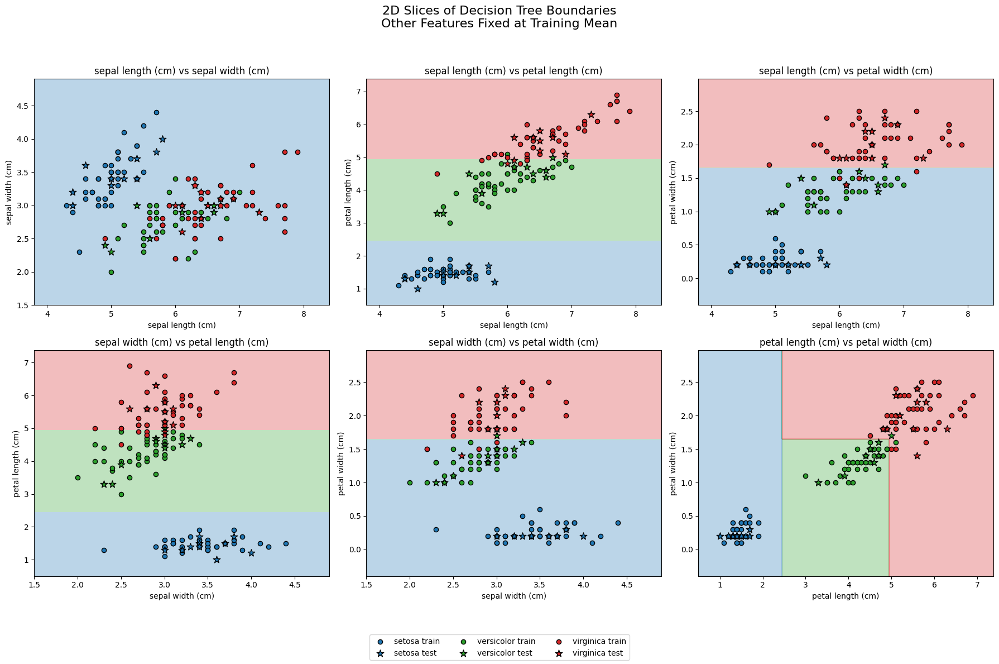

In [ ]:
import itertools
from matplotlib.colors import ListedColormap

# -----------------------
# Colors
# -----------------------

class_colors = ['#1f77b4', '#2ca02c', '#d62728']
cmap_light = ListedColormap(class_colors)

# -----------------------
# All feature pairs
# -----------------------

pairs = list(itertools.combinations(range(X.shape[1]), 2))

plot_step = 0.02

fig, axes = plt.subplots(2, 3, figsize=(18, 12))
axes = axes.flatten()

# Means of features used to fix non-plotted dimensions
feature_means = X_train.mean(axis=0)

for idx, (i, j) in enumerate(pairs):

    ax = axes[idx]

    # Mesh grid for selected feature pair
    x_min, x_max = X[:, i].min() - 0.5, X[:, i].max() + 0.5
    y_min, y_max = X[:, j].min() - 0.5, X[:, j].max() + 0.5

    xx, yy = np.meshgrid(
        np.arange(x_min, x_max, plot_step),
        np.arange(y_min, y_max, plot_step)
    )

    # Create full feature matrix for prediction
    X_slice = np.tile(
        feature_means,
        (xx.ravel().shape[0], 1)
    )

    X_slice[:, i] = xx.ravel()
    X_slice[:, j] = yy.ravel()

    Z = clf.predict(X_slice).reshape(xx.shape)

    # Decision surface
    ax.contourf(
        xx,
        yy,
        Z,
        alpha=0.3,
        cmap=cmap_light
    )

    # Data points
    for class_idx, class_color in enumerate(class_colors):
        ax.scatter(
            X_train[y_train == class_idx, i],
            X_train[y_train == class_idx, j],
            label=f"{target_names[class_idx]} train",
            c=class_color,
            edgecolor='k',
            s=35
        )

        ax.scatter(
            X_test[y_test == class_idx, i],
            X_test[y_test == class_idx, j],
            label=f"{target_names[class_idx]} test",
            c=class_color,
            edgecolor='k',
            s=90,
            marker='*'
        )

    ax.set_xlabel(feature_names[i])
    ax.set_ylabel(feature_names[j])
    ax.set_title(f"{feature_names[i]} vs {feature_names[j]}")

# One legend only
handles, labels = axes[0].get_legend_handles_labels()
fig.legend(
    handles,
    labels,
    loc='lower center',
    ncol=3
)

fig.suptitle(
    "2D Slices of Decision Tree Boundaries\nOther Features Fixed at Training Mean",
    fontsize=16
)

plt.tight_layout(rect=[0, 0.08, 1, 0.95])
plt.show()

Different criteria can be used to decide where to split:

$$\text{Gini}(t) = 1 - \sum_{i=1}^{C} p_i^2$$

$$\Delta \text{Gini} = \text{Gini}_{\text{parent}} - \left( \frac{N_L}{N} \cdot \text{Gini}_L + \frac{N_R}{N} \cdot \text{Gini}_R \right)$$

$$\text{Entropy}(t) = -\sum_{i=1}^{C} p_i \log_2 p_i
$$

$$\text{Information Gain} = \text{Entropy}_{\text{parent}} - \left( \frac{N_L}{N} \cdot \text{Entropy}_L + \frac{N_R}{N} \cdot \text{Entropy}_R \right)
$$

Both measures are biased toward variables with many levels

In [ ]:
clf_gini = DecisionTreeClassifier(criterion='gini', max_depth=3, random_state=42)
clf_entropy = DecisionTreeClassifier(criterion='entropy', max_depth=3, random_state=42)

clf_gini.fit(X_train, y_train)
clf_entropy.fit(X_train, y_train)

print(f"Gini Test Accuracy:    {accuracy_score(y_test, clf_gini.predict(X_test)):.2f}")
print(f"Entropy Test Accuracy: {accuracy_score(y_test, clf_entropy.predict(X_test)):.2f}")


Gini Test Accuracy:    0.97
Entropy Test Accuracy: 0.97


We can measure feature importance as the (weighted) sum of the delta gini / entropy in all nodes in which it was used

$$
\text{Importance of feature } j = \sum_{\text{nodes } t \text{ using } j} \frac{N_t}{N} \cdot \Delta \text{Impurity}_t
$$

In [ ]:
importances = clf.feature_importances_
for name, score in sorted(zip(feature_names, importances), key=lambda x: -x[1]):
    print(f"{name:25s}: {score:.3f}")


petal length (cm)        : 0.579
petal width (cm)         : 0.421
sepal length (cm)        : 0.000
sepal width (cm)         : 0.000


## Depth control

Best depth: 3
Best test accuracy: 0.967
   Depth  Train Accuracy  Test Accuracy
0      1            0.67           0.67
1      2            0.97           0.93
2      3            0.98           0.97
3      4            0.99           0.93
4      5            1.00           0.93
5      6            1.00           0.93
6      7            1.00           0.93
7      8            1.00           0.93
8      9            1.00           0.93
9     10            1.00           0.93


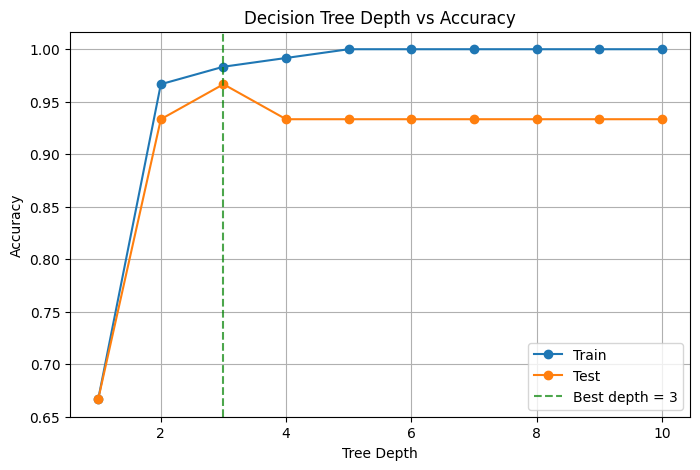

In [ ]:
# -----------------------
# Evaluate different depths
# -----------------------

depths = range(1, 11)

train_scores = []
test_scores = []

for d in depths:

    clf = DecisionTreeClassifier(
        max_depth=d,
        random_state=42
    )

    clf.fit(X_train, y_train)

    train_pred = clf.predict(X_train)
    test_pred = clf.predict(X_test)

    train_scores.append(
        accuracy_score(y_train, train_pred)
    )

    test_scores.append(
        accuracy_score(y_test, test_pred)
    )

# -----------------------
# Best depth
# -----------------------

best_idx = np.argmax(test_scores)
best_depth = list(depths)[best_idx]

print(f"Best depth: {best_depth}")
print(f"Best test accuracy: {test_scores[best_idx]:.3f}")

# -----------------------
# Results dataframe
# -----------------------

depth_results_df = pd.DataFrame({
    'Depth': list(depths),
    'Train Accuracy': train_scores,
    'Test Accuracy': test_scores
})

print(depth_results_df)

# -----------------------
# Plot
# -----------------------

plt.figure(figsize=(8, 5))

plt.plot(
    depths,
    train_scores,
    marker='o',
    label="Train"
)

plt.plot(
    depths,
    test_scores,
    marker='o',
    label="Test"
)

plt.axvline(
    best_depth,
    linestyle='--',
    alpha=0.7,
    label=f'Best depth = {best_depth}',
    color='green'
)

plt.xlabel("Tree Depth")
plt.ylabel("Accuracy")
plt.title("Decision Tree Depth vs Accuracy")
plt.legend()
plt.grid(True)

plt.show()

## Regression Tree

In [ ]:
from sklearn.tree import DecisionTreeRegressor

# -----------------------
# Features and target
# -----------------------

X = df.drop(columns='ejection_fraction')
y = df['ejection_fraction']

categorical_vars_model = [v for v in cat_vars if v in X.columns]
numeric_vars_model = [v for v in X.columns if v not in categorical_vars_model]

# -----------------------
# Preprocessing
# -----------------------

preprocessor = ColumnTransformer([
    ('cat', OneHotEncoder(
        drop='first',
        handle_unknown='ignore'
    ), categorical_vars_model)
], remainder='passthrough',
  verbose_feature_names_out=False # avoid adding prefixes to variable names after preproc
                                 )

# -----------------------
# Pipeline
# -----------------------

pipeline = Pipeline([
    ('preprocessor', preprocessor),
    ('regressor', DecisionTreeRegressor(
        random_state=42,
        max_depth=4
    ))
])

# -----------------------
# Train/test split
# -----------------------

X_train, X_test, y_train, y_test = train_test_split(
    X,
    y,
    test_size=0.2,
    random_state=42
)

# -----------------------
# Fit model
# -----------------------

pipeline.fit(X_train, y_train)

# -----------------------
# Predictions
# -----------------------

y_pred = pipeline.predict(X_test)

# -----------------------
# Metrics
# -----------------------

r2 = r2_score(y_test, y_pred)
mse = mean_squared_error(y_test, y_pred)
rmse = np.sqrt(mse)
mae = mean_absolute_error(y_test, y_pred)

print(f"R² Score: {r2:.3f}")
print(f"MSE:      {mse:.3f}")
print(f"RMSE:     {rmse:.3f}")
print(f"MAE:      {mae:.3f}")

R² Score: 0.473
MSE:      91.842
RMSE:     9.583
MAE:      7.626


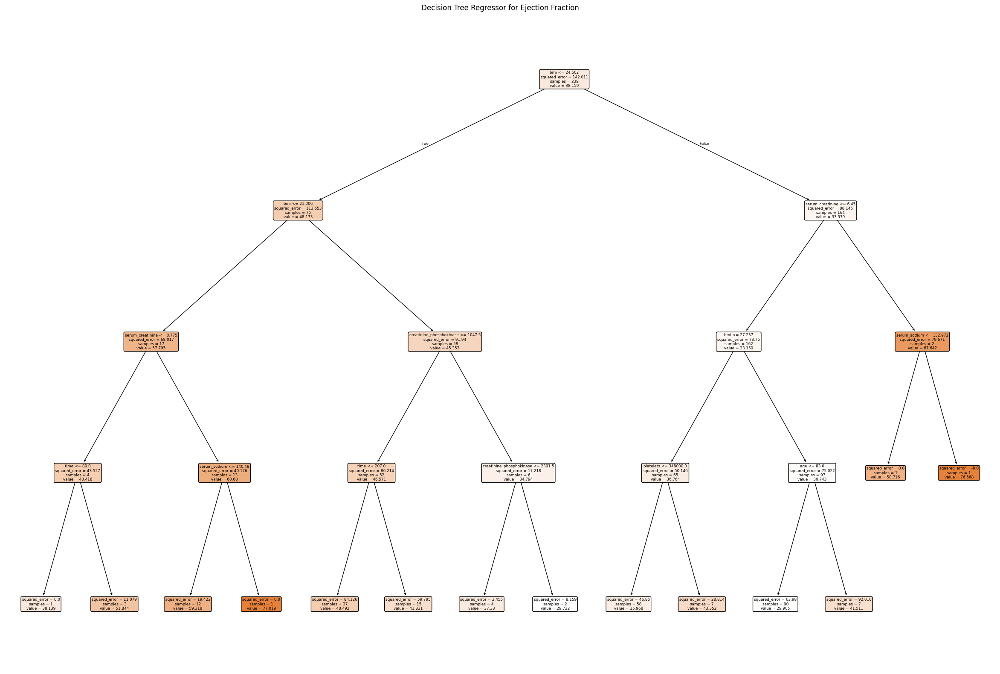

In [ ]:
from sklearn.tree import plot_tree
import matplotlib.pyplot as plt

# Get feature names after preprocessing
all_feature_names = (
    pipeline
    .named_steps['preprocessor']
    .get_feature_names_out()
)

# Extract fitted tree
reg_tree = pipeline.named_steps['regressor']

# Plot tree
plt.figure(figsize=(30, 20))

plot_tree(
    reg_tree,
    feature_names=all_feature_names,
    filled=True,
    rounded=True
)

plt.title("Decision Tree Regressor for Ejection Fraction")
plt.show()

# Random Forest

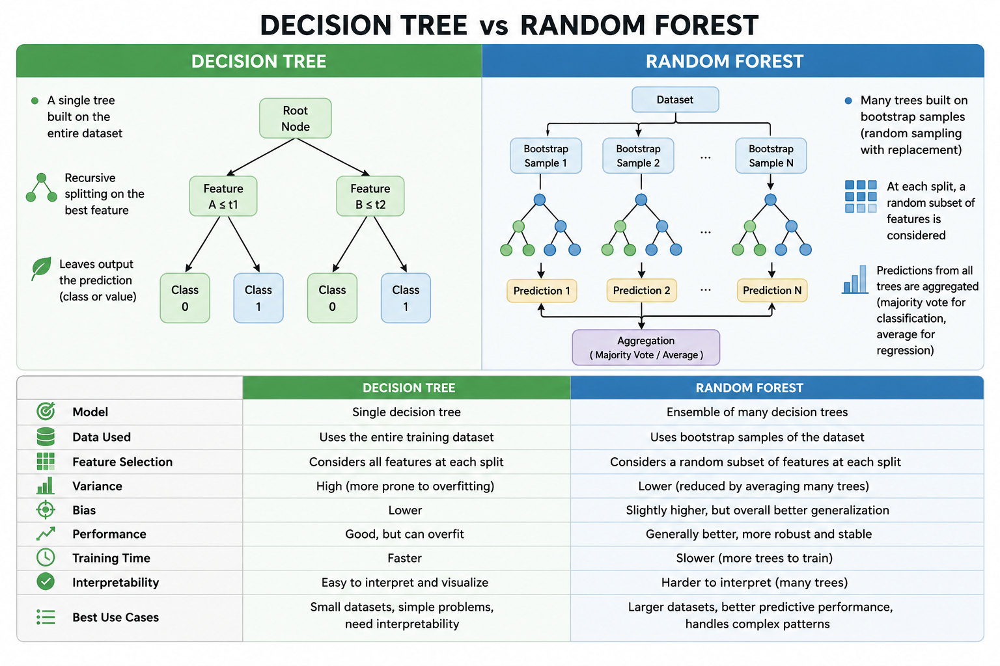

In [ ]:
from sklearn.ensemble import RandomForestClassifier

# Load data
iris = load_iris()
X, y = iris.data, iris.target
feature_names = iris.feature_names
target_names = iris.target_names

# Train/test split
X_train, X_test, y_train, y_test = train_test_split(X, y, stratify=y, test_size=0.2, random_state=42)

# Train Random Forest
rf = RandomForestClassifier(n_estimators=100, max_depth=5, random_state=42)
rf.fit(X_train, y_train)

# Predict
y_pred = rf.predict(X_test)

# Evaluate
acc = accuracy_score(y_test, y_pred)
print(f"Test Accuracy: {acc:.3f}")
print("\nClassification Report:")
print(classification_report(y_test, y_pred, target_names=target_names))

Test Accuracy: 0.933

Classification Report:
              precision    recall  f1-score   support

      setosa       1.00      1.00      1.00        10
  versicolor       0.90      0.90      0.90        10
   virginica       0.90      0.90      0.90        10

    accuracy                           0.93        30
   macro avg       0.93      0.93      0.93        30
weighted avg       0.93      0.93      0.93        30



## Hyperparameters

Recommended values are $m=p/3$ for regression and $m=\sqrt{p}$ for classification, with $m$ being the % of features to keep in each tree(max_features), and $p$ the number of features in the dataset

In [ ]:
param_grid = {
    "n_estimators": [10, 50, 100],
    "max_depth": [None, 3, 5, 10],
    "max_features": ["sqrt", "log2", None, 0.8]
}

# Grid search
rf = RandomForestClassifier(random_state=42)

grid_search = GridSearchCV(
    rf,
    param_grid,
    cv=5,
    scoring="f1_macro",
    verbose=1
)

grid_search.fit(X_train, y_train)

# Best model
best_rf = grid_search.best_estimator_

print(f"Best Parameters: {grid_search.best_params_}")
print(f"Best CV F1 Macro: {grid_search.best_score_:.3f}")

# Test performance
y_pred = best_rf.predict(X_test)

print(f"\nTest Accuracy: {accuracy_score(y_test, y_pred):.3f}")
print("\nClassification Report:")
print(classification_report(y_test, y_pred, target_names=target_names))

Fitting 5 folds for each of 48 candidates, totalling 240 fits
Best Parameters: {'max_depth': None, 'max_features': 'sqrt', 'n_estimators': 10}
Best CV F1 Macro: 0.958

Test Accuracy: 0.967

Classification Report:
              precision    recall  f1-score   support

      setosa       1.00      1.00      1.00        10
  versicolor       1.00      0.90      0.95        10
   virginica       0.91      1.00      0.95        10

    accuracy                           0.97        30
   macro avg       0.97      0.97      0.97        30
weighted avg       0.97      0.97      0.97        30



## Out-Of-Bag (OOB) Evaluation



1.   For each training point, collect predictions from only the trees that didn’t see it.
2.  Compare these predictions to the true labels.
3.  Average the accuracy (or other metric) over all such point






In [ ]:
rf_oob = RandomForestClassifier(
    oob_score=True,
    n_estimators=100,
    random_state=42
)

rf_oob.fit(X_train, y_train)

print(f"OOB Accuracy: {rf_oob.oob_score_:.3f}")

OOB Accuracy: 0.942


The scikit-learn OOB implementation is limited to accuracy for classification and $R^2$ for regression. Other metrics can be computed by accessing the OOB predictions:

In [ ]:
rf_oob.oob_decision_function_

array([[1.        , 0.        , 0.        ],
       [0.        , 0.74285714, 0.25714286],
       [0.        , 0.90909091, 0.09090909],
       [1.        , 0.        , 0.        ],
       [0.        , 1.        , 0.        ],
       [0.        , 0.04878049, 0.95121951],
       [0.        , 1.        , 0.        ],
       [0.        , 0.55555556, 0.44444444],
       [0.        , 0.        , 1.        ],
       [0.        , 0.        , 1.        ],
       [0.        , 0.        , 1.        ],
       [0.        , 0.95833333, 0.04166667],
       [0.        , 0.82857143, 0.17142857],
       [0.        , 1.        , 0.        ],
       [0.        , 1.        , 0.        ],
       [1.        , 0.        , 0.        ],
       [1.        , 0.        , 0.        ],
       [0.        , 0.        , 1.        ],
       [0.        , 0.        , 1.        ],
       [1.        , 0.        , 0.        ],
       [0.        , 0.63829787, 0.36170213],
       [1.        , 0.        , 0.        ],
       [0.

In [ ]:
from sklearn.metrics import f1_score

y_pred_oob = np.argmax(rf_oob.oob_decision_function_, axis=1)

f1 = f1_score(y_train, y_pred_oob, average="macro")
print(f"OOB F1 Score (macro): {f1:.3f}")

OOB F1 Score (macro): 0.942


A comparison of OOB and CV:

| Aspect                | OOB             | Cross-validation |
| --------------------- | --------------- | ---------------- |
| Computational cost    | Lower           | Higher           |
| Number of trainings   | 1               | K trainings      |
| Specific to bagging?  | Yes             | No               |
| Works for any model   | No              | Yes              |
| Variance of estimate  | Slightly higher | Usually lower    |
| Flexibility           | Limited         | Very flexible    |
| Hyperparameter tuning | Less ideal      | Better           |



## Feature Importance

It uses the same logic as single decision trees, but averages across all trees and normalizes so importances sum to 1.

Keep in mind that these feature importance measure is biased towards features with a lot of splits (and so numerical features) and that, if there are correlated variables, their importance is diluited among them.

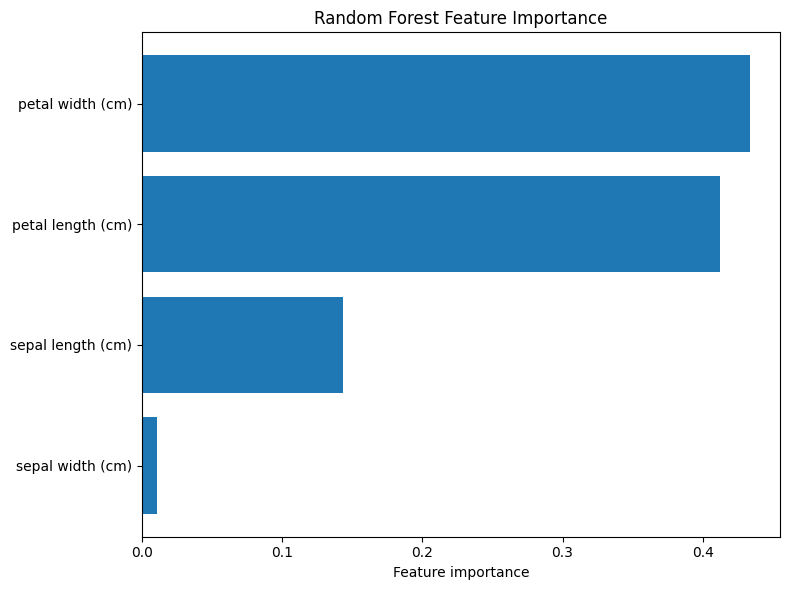

In [ ]:
importances = best_rf.feature_importances_
sorted_idx = np.argsort(importances)

plt.figure(figsize=(8, 6))
plt.barh(np.array(feature_names)[sorted_idx], importances[sorted_idx])
plt.xlabel("Feature importance")
plt.title("Random Forest Feature Importance")
plt.tight_layout()
plt.show()

## Random Forest for Regression

In [ ]:
from sklearn.ensemble import RandomForestRegressor

# Separate features/target
X = df.drop(columns="ejection_fraction")
y = df["ejection_fraction"]

numeric_vars = num_vars.copy()
numeric_vars.remove("ejection_fraction")
categorical_vars = cat_vars.copy()

# Preprocessing
preprocessor = ColumnTransformer(
    transformers=[
        ("cat", OneHotEncoder(drop="first", handle_unknown="ignore"), categorical_vars)
    ],
    remainder="passthrough"
)

# Pipeline
pipeline = Pipeline([
    ("preprocessor", preprocessor),
    ("model", RandomForestRegressor(
        n_estimators=100,
        random_state=42,
        oob_score=True
    ))
])

# Split data
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.2, random_state=42
)

# Fit and predict
pipeline.fit(X_train, y_train)
y_pred = pipeline.predict(X_test)

# Evaluation
r2 = r2_score(y_test, y_pred)
mse = mean_squared_error(y_test, y_pred)
rmse = np.sqrt(mse)
mae = mean_absolute_error(y_test, y_pred)

rf_model = pipeline.named_steps["model"]

print(f"OOB R²: {rf_model.oob_score_:.3f}")
print(f"Test R²: {r2:.3f}")
print(f"MSE:     {mse:.2f}")
print(f"RMSE:    {rmse:.2f}")
print(f"MAE:     {mae:.2f}")

OOB R²: 0.413
Test R²: 0.560
MSE:     76.62
RMSE:    8.75
MAE:     6.99


# Gradient Boosting

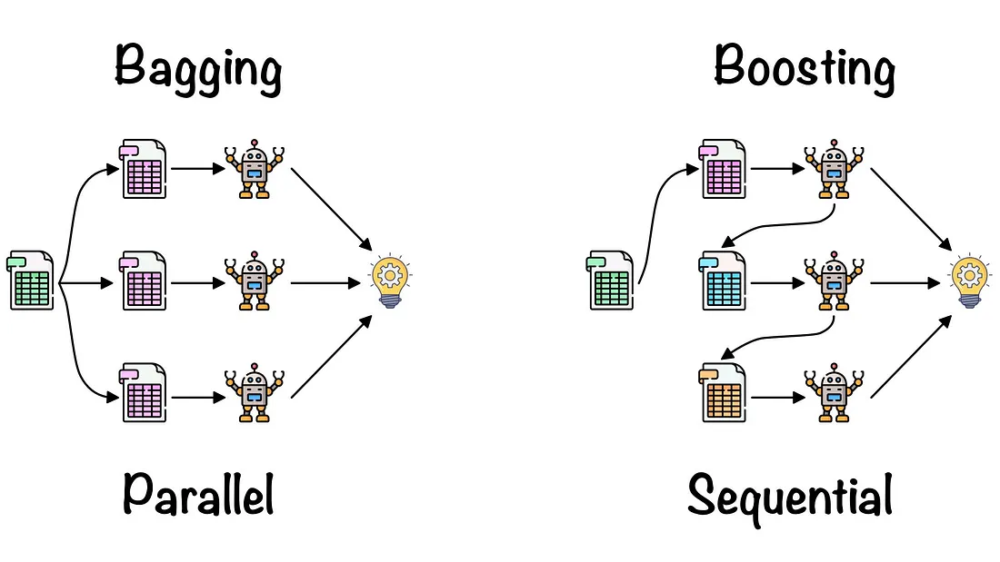

## Classification

Test Accuracy: 0.967

Classification Report:
              precision    recall  f1-score   support

      setosa       1.00      1.00      1.00        10
  versicolor       1.00      0.90      0.95        10
   virginica       0.91      1.00      0.95        10

    accuracy                           0.97        30
   macro avg       0.97      0.97      0.97        30
weighted avg       0.97      0.97      0.97        30



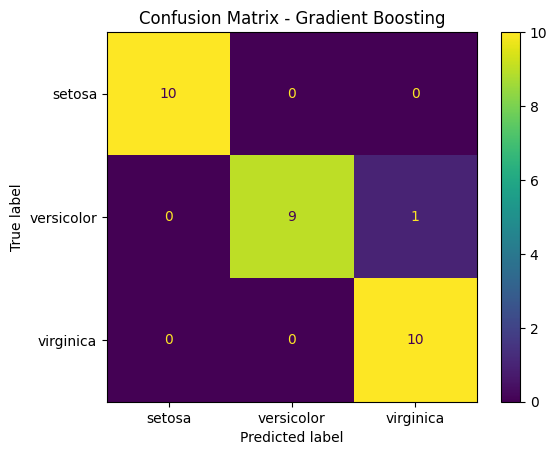

In [ ]:
from sklearn.ensemble import GradientBoostingClassifier

# Load iris data
iris = load_iris()
X, y = iris.data, iris.target
feature_names = iris.feature_names
target_names = iris.target_names

# Train/test split
X_train, X_test, y_train, y_test = train_test_split(X, y, stratify=y, test_size=0.2, random_state=42)

# Gradient Boosting fit
gb = GradientBoostingClassifier(n_estimators=100, learning_rate=0.1, max_depth=3, random_state=42)
gb.fit(X_train, y_train)

# Predict
y_pred = gb.predict(X_test)

# Evaluate
acc = accuracy_score(y_test, y_pred)
print(f"Test Accuracy: {acc:.3f}")
print("\nClassification Report:")
print(classification_report(y_test, y_pred, target_names=target_names))

ConfusionMatrixDisplay.from_estimator(gb, X_test, y_test, display_labels=target_names)
plt.title("Confusion Matrix - Gradient Boosting")
plt.show()

## Regression

In [ ]:
from sklearn.ensemble import GradientBoostingRegressor

# Separate features/target
X = df.drop(columns="ejection_fraction")
y = df["ejection_fraction"]

numeric_vars = num_vars.copy()
numeric_vars.remove("ejection_fraction")
categorical_vars = cat_vars.copy()

# Preprocessing
preprocessor = ColumnTransformer(
    transformers=[
        ("cat", OneHotEncoder(drop="first", handle_unknown="ignore"), categorical_vars)
    ],
    remainder="passthrough"
)

# Pipeline
pipeline = Pipeline([
    ("preprocessor", preprocessor),
    ("model", GradientBoostingRegressor(
        n_estimators=100,
        learning_rate=0.1,
        max_depth=3,
        random_state=42
    ))
])

# Train/test split
X_train, X_test, y_train, y_test = train_test_split(
    X, y,
    test_size=0.3,
    random_state=42
)

# Fit model
pipeline.fit(X_train, y_train)

# Predict
y_pred = pipeline.predict(X_test)

# Evaluation
r2 = r2_score(y_test, y_pred)
mse = mean_squared_error(y_test, y_pred)
rmse = np.sqrt(mse)
mae = mean_absolute_error(y_test, y_pred)

# Output
print(f"R²:   {r2:.3f}")
print(f"MSE:  {mse:.2f}")
print(f"RMSE: {rmse:.2f}")
print(f"MAE:  {mae:.2f}")

R²:   0.493
MSE:  87.04
RMSE: 9.33
MAE:  7.52


## XGBoost

XGboost is an improved gradient boosting that adds regularization, efficient tree construction, shrinkage, and row/column subsampling, making it often more accurate and robust.

Test Accuracy - XGBoost: 0.933

Classification Report - XGBoost:
              precision    recall  f1-score   support

      setosa       1.00      1.00      1.00        10
  versicolor       0.90      0.90      0.90        10
   virginica       0.90      0.90      0.90        10

    accuracy                           0.93        30
   macro avg       0.93      0.93      0.93        30
weighted avg       0.93      0.93      0.93        30



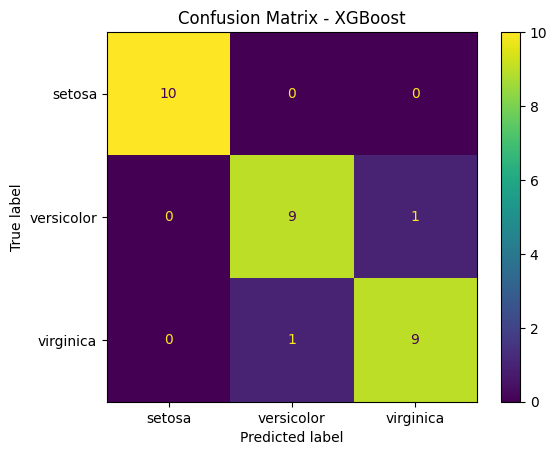

In [ ]:
from xgboost import XGBClassifier

# Load iris data
iris = load_iris()
X, y = iris.data, iris.target
feature_names = iris.feature_names
target_names = iris.target_names

# Train/test split
X_train, X_test, y_train, y_test = train_test_split(X, y, stratify=y, test_size=0.2, random_state=42)

# XGBoost fit
xgb = XGBClassifier(
    n_estimators=100,
    learning_rate=0.1,
    max_depth=3,
    objective="multi:softprob",
    num_class=3,
    eval_metric="mlogloss",
    random_state=42
)

xgb.fit(X_train, y_train)

# Predict
y_pred_xgb = xgb.predict(X_test)

# Evaluate
acc_xgb = accuracy_score(y_test, y_pred_xgb)
print(f"Test Accuracy - XGBoost: {acc_xgb:.3f}")
print("\nClassification Report - XGBoost:")
print(classification_report(y_test, y_pred_xgb, target_names=target_names))

ConfusionMatrixDisplay.from_estimator(
    xgb, X_test, y_test,
    display_labels=target_names
)
plt.title("Confusion Matrix - XGBoost")
plt.show()

In [ ]:
from xgboost import XGBRegressor

# Separate features/target
X = df.drop(columns="ejection_fraction")
y = df["ejection_fraction"]

numeric_vars = num_vars.copy()
numeric_vars.remove("ejection_fraction")
categorical_vars = cat_vars.copy()

# Preprocessing
preprocessor = ColumnTransformer(
    transformers=[
        ("cat", OneHotEncoder(drop="first", handle_unknown="ignore"), categorical_vars)
    ],
    remainder="passthrough"
)

# Pipeline with XGBoost
pipeline = Pipeline([
    ("preprocessor", preprocessor),
    ("model", XGBRegressor(
        n_estimators=300,
        learning_rate=0.05,
        max_depth=3,
        subsample=0.8,
        colsample_bytree=0.8,
        objective="reg:squarederror",
        random_state=42
    ))
])

# Train/test split
X_train, X_test, y_train, y_test = train_test_split(
    X, y,
    test_size=0.3,
    random_state=42
)

# Fit model
pipeline.fit(X_train, y_train)

# Predict
y_pred = pipeline.predict(X_test)

# Evaluation
r2 = r2_score(y_test, y_pred)
mse = mean_squared_error(y_test, y_pred)
rmse = np.sqrt(mse)
mae = mean_absolute_error(y_test, y_pred)

print(f"R²:   {r2:.3f}")
print(f"MSE:  {mse:.2f}")
print(f"RMSE: {rmse:.2f}")
print(f"MAE:  {mae:.2f}")

R²:   0.461
MSE:  92.45
RMSE: 9.61
MAE:  7.65


There are many hyperparameters in XGBoost, you can try to optimize them with a grid search

n_estimators       # number of boosting trees

learning_rate      # contribution of each tree

max_depth          # complexity of each tree

subsample          # fraction of rows used per tree

colsample_bytree   # fraction of features used per tree

# AT HOME

## Recursive Feature Elimination (RFE)

RFE is anothe wrapper feature selection method that exploit an internal measure of feature importance provided by the model you are fitting. For istance, for linear and logistic regression it exploits the magnitude of betas coefficients (it is very important to standardize num variables!), while for random forest it exploits the feature importance score provided by RF.

In [ ]:
from sklearn.linear_model import LinearRegression
from sklearn.feature_selection import RFE
from sklearn.preprocessing import StandardScaler
import time

# Preprocessing
preprocessor = ColumnTransformer([
    ("num", StandardScaler(), numeric_vars),
    ("cat", OneHotEncoder(drop="first", sparse_output=False), categorical_vars)
])

X_train_proc = preprocessor.fit_transform(X_train)
X_test_proc = preprocessor.transform(X_test)

feature_names = np.array(preprocessor.get_feature_names_out())


# RFE
rfe = RFE(
    estimator=LinearRegression(),
    n_features_to_select=5
)

rfe.fit(X_train_proc, y_train)

# Selected features
rfe_mask = rfe.get_support()

# Train final model
model_rfe = LinearRegression().fit(
    X_train_proc[:, rfe_mask],
    y_train
)

# Predict
y_pred_rfe = model_rfe.predict(X_test_proc[:, rfe_mask])

# Metrics
r2 = r2_score(y_test, y_pred_rfe)
mse = mean_squared_error(y_test, y_pred_rfe)

print(f"R²:  {r2:.3f}")
print(f"MSE: {mse:.2f}")

print("\nSelected features:")
print(np.array(feature_names)[rfe_mask])

R²:  0.471
MSE: 90.70

Selected features:
['num__serum_creatinine' 'num__bmi' 'cat__anaemia_1' 'cat__sex_Male'
 'cat__DEATH_EVENT_True']


## Penalized Logistic Regression

Logistic Regression can similarly be regularized with ridge or lasso penalty

$$
\min_{\boldsymbol{\beta}}
\left\{
 - \sum_{i=1}^{n}
 \big[
   y_i \log p_i + (1 - y_i)\log(1 - p_i)
 \big]
 \;+\;
 \frac{1}{C} \sum_{j=1}^{p} \beta_j^{2}
\right\},
\qquad
p_i = \frac{1}{1 + e^{-(\beta_0 + \mathbf{x}_i^\top \boldsymbol{\beta})}}.
$$

Here $ C = 1 / \alpha $

In [ ]:
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split, GridSearchCV

# Features and target
X = df[['age', 'anaemia', 'creatinine_phosphokinase', 'diabetes', 'high_blood_pressure',
        'platelets', 'serum_creatinine', 'serum_sodium', 'sex', 'smoking', 'bmi', 'time', 'ejection_fraction']]
y = df['DEATH_EVENT']

categorical_vars = cat_vars.copy()
categorical_vars.remove('DEATH_EVENT')

# -----------------------
# Train/test split
# -----------------------

X_train, X_test, y_train, y_test = train_test_split(
    X, y,
    test_size=0.2,
    random_state=123,
    stratify=y
)

# -----------------------
# Preprocessing
# -----------------------

preprocessor = ColumnTransformer([
    ('num', StandardScaler(), num_vars),
    ('cat', OneHotEncoder(
        drop='first',
        sparse_output=False,
        handle_unknown='ignore'
    ), categorical_vars)
])

# -----------------------
# Pipelines
# -----------------------

logreg_none_pipeline = Pipeline([
    ('preprocessor', preprocessor),
    ('classifier', LogisticRegression(
        penalty=None,
        solver='lbfgs',
        max_iter=1000
    ))
])

logreg_l2_pipeline = Pipeline([
    ('preprocessor', preprocessor),
    ('classifier', LogisticRegression(
        penalty='l2',
        solver='liblinear',
        max_iter=1000
    ))
])

logreg_l1_pipeline = Pipeline([
    ('preprocessor', preprocessor),
    ('classifier', LogisticRegression(
        penalty='l1',
        solver='liblinear',
        max_iter=1000
    ))
])

# -----------------------
# Grid search over C
# -----------------------

C_grid = np.logspace(-3, 3, 50)

logreg_l2_cv = GridSearchCV(
    logreg_l2_pipeline,
    {'classifier__C': C_grid},
    cv=5,
    scoring='roc_auc'
)

logreg_l1_cv = GridSearchCV(
    logreg_l1_pipeline,
    {'classifier__C': C_grid},
    cv=5,
    scoring='roc_auc'
)

# -----------------------
# Fit models
# -----------------------

logreg_none_pipeline.fit(X_train, y_train)
logreg_l2_cv.fit(X_train, y_train)
logreg_l1_cv.fit(X_train, y_train)

print("Best C for Logistic Regression L2:", logreg_l2_cv.best_params_['classifier__C'])
print("Best C for Logistic Regression L1:", logreg_l1_cv.best_params_['classifier__C'])

# -----------------------
# Predictions
# -----------------------

y_pred_none = logreg_none_pipeline.predict(X_test)
y_proba_none = logreg_none_pipeline.predict_proba(X_test)[:, 1]

y_pred_l2 = logreg_l2_cv.predict(X_test)
y_proba_l2 = logreg_l2_cv.predict_proba(X_test)[:, 1]

y_pred_l1 = logreg_l1_cv.predict(X_test)
y_proba_l1 = logreg_l1_cv.predict_proba(X_test)[:, 1]

# -----------------------
# Evaluation
# -----------------------

def evaluate_classification(y_true, y_pred, y_proba, model_name):
    return {
        'Model': model_name,
        'Accuracy': accuracy_score(y_true, y_pred),
        'Precision': precision_score(y_true, y_pred, zero_division=0),
        'Recall': recall_score(y_true, y_pred, zero_division=0),
        'F1 Score': f1_score(y_true, y_pred, zero_division=0),
        'ROC AUC': roc_auc_score(y_true, y_proba)
    }

metrics_classif_df = pd.DataFrame([
    evaluate_classification(y_test, y_pred_none, y_proba_none, 'LogReg None'),
    evaluate_classification(y_test, y_pred_l2, y_proba_l2, 'LogReg L2'),
    evaluate_classification(y_test, y_pred_l1, y_proba_l1, 'LogReg L1')
])

print("\nClassification Performance:")
print(metrics_classif_df)

# -----------------------
# Coefficient comparison
# -----------------------

feature_names = (
    logreg_l2_cv
    .best_estimator_
    .named_steps['preprocessor']
    .get_feature_names_out()
)

coef_df = pd.DataFrame({
    'Feature': ['Intercept'] + list(feature_names),

    'No Reg': (
        [logreg_none_pipeline.named_steps['classifier'].intercept_[0]]
        + list(logreg_none_pipeline.named_steps['classifier'].coef_[0])
    ),

    'L2': (
        [logreg_l2_cv.best_estimator_.named_steps['classifier'].intercept_[0]]
        + list(logreg_l2_cv.best_estimator_.named_steps['classifier'].coef_[0])
    ),

    'L1': (
        [logreg_l1_cv.best_estimator_.named_steps['classifier'].intercept_[0]]
        + list(logreg_l1_cv.best_estimator_.named_steps['classifier'].coef_[0])
    )
})

print("\nCoefficient Comparison:")
print(coef_df)

Best C for Logistic Regression L2: 0.029470517025518096
Best C for Logistic Regression L1: 0.1206792640639329

Classification Performance:
         Model  Accuracy  Precision  Recall  F1 Score  ROC AUC
0  LogReg None      0.87       0.87    0.68      0.76     0.88
1    LogReg L2      0.87       0.92    0.63      0.75     0.91
2    LogReg L1      0.88       0.93    0.68      0.79     0.91

Coefficient Comparison:
                          Feature  No Reg    L2    L1
0                       Intercept   -1.51 -0.36 -0.79
1                        num__age    0.51  0.24  0.20
2   num__creatinine_phosphokinase    0.13  0.07  0.00
3          num__ejection_fraction   -0.45 -0.21 -0.06
4                  num__platelets   -0.21 -0.08  0.00
5           num__serum_creatinine    0.28  0.18  0.00
6               num__serum_sodium    0.05  0.03  0.00
7                        num__bmi    0.58  0.27  0.52
8                       num__time   -1.61 -0.65 -1.05
9                  cat__anaemia_1    0.29 -0

## Cost sensitive classification - Banknotes example with KNN [EXTRA]

The vending machines of the ExxonMobil fuel stations contain optical detectors able to measure the size of inserted banknotes. Knowing that 0.1 % of the 10 \$ banknotes in circulation are counterfeit, Exxon would like to implement a software system to identify false 10 \$ banknotes and minimize economic losses.

Assume that:

* accepting a counterfeit banknote leads to an economic loss of 10$;
* rejecting a genuine banknote leads to an economic loss of 5 cents;
* no parametric assumption is made on the distributions of genuine and counterfeit banknotes.

Using the datasets moneytrue.txt and moneyfalse.txt, containing measurements (in mm) of 100 genuine and 100 counterfeit banknotes:

1. build a classifier based on the K-Nearest Neighbors (KNN) method;
2. choose an appropriate value of k;
3. incorporate the asymmetric misclassification costs and the prior probability of counterfeit banknotes into the decision rule;
4. qualitatively display the classification regions in a graph;
5. evaluate the classifier performance through an appropriate confusion matrix and discuss the effect of the asymmetric costs on the decision boundary.

In [ ]:
from sklearn.neighbors import KNeighborsClassifier
from sklearn.model_selection import StratifiedKFold, cross_val_predict
from sklearn.metrics import confusion_matrix, classification_report
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import Pipeline


# -----------------------------
# Load data
# -----------------------------
true_df  = pd.read_table(PATH + "/moneytrue.txt", sep=r"\s+")
false_df = pd.read_table(PATH + "/moneyfalse.txt", sep=r"\s+")

X_true  = true_df[["V1", "V2"]].values
X_false = false_df[["V1", "V2"]].values

X = np.vstack([X_true, X_false])
y = np.array([0] * len(X_true) + [1] * len(X_false))  # 0 = true, 1 = false


# -----------------------------
# Costs and priors
# -----------------------------
pi_true = 0.999
pi_false = 0.001

C_false_accepted = 10.00   # false classified as true
C_true_rejected = 0.05     # true classified as false

# Decision rule:
# predict false if:
# C_false_accepted * P(false | x) > C_true_rejected * P(true | x)


# -----------------------------
# Choose k by cross-validation
# minimizing expected economic loss
# -----------------------------
def expected_loss(y_true, prob_false):
    prob_true = 1 - prob_false

    y_pred = np.where(
        C_false_accepted * prob_false > C_true_rejected * prob_true,
        1,  # false
        0   # true
    )

    loss = np.where(
        (y_true == 1) & (y_pred == 0), C_false_accepted,
        np.where((y_true == 0) & (y_pred == 1), C_true_rejected, 0)
    )

    return loss.mean()


candidate_k = range(3, 31, 2)
cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=123)

losses = {}

for k in candidate_k:
    clf = Pipeline([
        ("scaler", StandardScaler()),
        ("knn", KNeighborsClassifier(n_neighbors=k))
    ])

    prob = cross_val_predict(
        clf, X, y,
        cv=cv,
        method="predict_proba"
    )

    prob_false_sample = prob[:, 1]

    # Correct empirical posterior using real-world priors
    # training data has artificial priors 0.5 / 0.5
    prob_false = pi_false * prob_false_sample
    prob_true = pi_true * prob[:, 0]

    norm = prob_false + prob_true
    prob_false = prob_false / norm

    losses[k] = expected_loss(y, prob_false)

best_k = min(losses, key=losses.get)

print("Cross-validated losses:")
for k, loss in losses.items():
    print(f"k={k:2d} | expected loss = {loss:.4f}")

print(f"\nBest k: {best_k}")


# -----------------------------
# Fit final model
# -----------------------------
clf = Pipeline([
    ("scaler", StandardScaler()),
    ("knn", KNeighborsClassifier(n_neighbors=best_k))
])

clf.fit(X, y)

prob_sample = clf.predict_proba(X)

prob_false = pi_false * prob_sample[:, 1]
prob_true = pi_true * prob_sample[:, 0]

norm = prob_false + prob_true
prob_false = prob_false / norm
prob_true = prob_true / norm

y_pred = np.where(
    C_false_accepted * prob_false > C_true_rejected * prob_true,
    1,
    0
)


# -----------------------------
# Results
# -----------------------------
print("\nConfusion matrix:")
print(confusion_matrix(y, y_pred))

print("\nClassification report:")
print(classification_report(
    y, y_pred,
    target_names=["true", "false"]
))

total_loss = np.sum(
    np.where(
        (y == 1) & (y_pred == 0), C_false_accepted,
        np.where((y == 0) & (y_pred == 1), C_true_rejected, 0)
    )
)

print(f"Total economic loss on training data: ${total_loss:.2f}")

Cross-validated losses:
k= 3 | expected loss = 3.2025
k= 5 | expected loss = 4.3015
k= 7 | expected loss = 3.4515
k= 9 | expected loss = 4.0012
k=11 | expected loss = 4.4508
k=13 | expected loss = 4.0512
k=15 | expected loss = 4.2508
k=17 | expected loss = 4.6002
k=19 | expected loss = 4.4505
k=21 | expected loss = 4.7500
k=23 | expected loss = 4.8500
k=25 | expected loss = 4.9000
k=27 | expected loss = 4.9000
k=29 | expected loss = 5.0000

Best k: 3

Confusion matrix:
[[100   0]
 [ 54  46]]

Classification report:
              precision    recall  f1-score   support

        true       0.65      1.00      0.79       100
       false       1.00      0.46      0.63       100

    accuracy                           0.73       200
   macro avg       0.82      0.73      0.71       200
weighted avg       0.82      0.73      0.71       200

Total economic loss on training data: $540.00


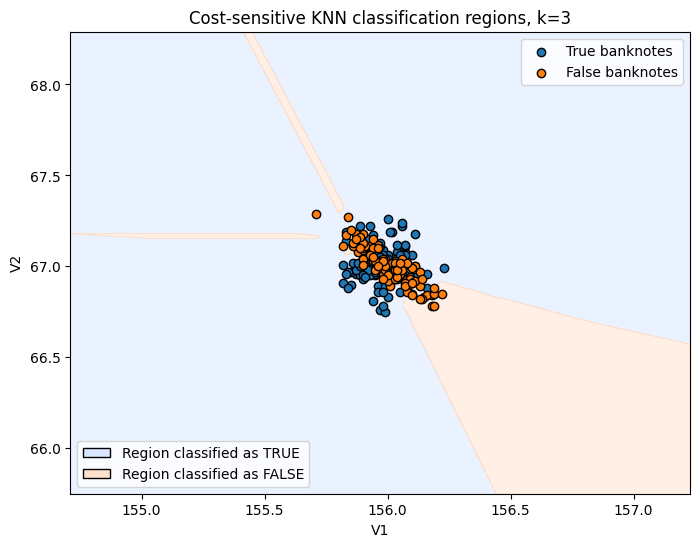

In [ ]:
from matplotlib.colors import ListedColormap
from matplotlib.patches import Patch

# -----------------------------
# Plot classification regions
# -----------------------------
x_min, x_max = X[:, 0].min() - 1, X[:, 0].max() + 1
y_min, y_max = X[:, 1].min() - 1, X[:, 1].max() + 1

xx, yy = np.meshgrid(
    np.linspace(x_min, x_max, 1000),
    np.linspace(y_min, y_max, 1000)
)

grid = np.c_[xx.ravel(), yy.ravel()]

grid_prob_sample = clf.predict_proba(grid)

grid_prob_false = pi_false * grid_prob_sample[:, 1]
grid_prob_true = pi_true * grid_prob_sample[:, 0]

grid_norm = grid_prob_false + grid_prob_true
grid_prob_false = grid_prob_false / grid_norm
grid_prob_true = grid_prob_true / grid_norm

Z = np.where(
    C_false_accepted * grid_prob_false > C_true_rejected * grid_prob_true,
    1,
    0
)

Z = Z.reshape(xx.shape)

# Custom background colors
cmap_bg = ListedColormap([
    "#d8e6ff",   # light blue -> true
    "#ffe0cc"    # light orange -> false
])

plt.figure(figsize=(8, 6))

# Background classification regions
plt.contourf(
    xx, yy, Z,
    alpha=0.5,
    cmap=cmap_bg
)

# Scatter points
plt.scatter(
    X_true[:, 0],
    X_true[:, 1],
    label="True banknotes",
    edgecolor="k",
    color="tab:blue"
)

plt.scatter(
    X_false[:, 0],
    X_false[:, 1],
    label="False banknotes",
    edgecolor="k",
    color="tab:orange"
)

# Region legend
region_legend = [
    Patch(facecolor="#d8e6ff", edgecolor='k',
          label="Region classified as TRUE"),
    Patch(facecolor="#ffe0cc", edgecolor='k',
          label="Region classified as FALSE")
]

# Combine legends
point_legend = plt.legend(loc="upper right")
plt.gca().add_artist(point_legend)

plt.legend(
    handles=region_legend,
    loc="lower left"
)

plt.xlabel("V1")
plt.ylabel("V2")
plt.title(f"Cost-sensitive KNN classification regions, k={best_k}")

plt.show()

The figure shows the decision regions obtained with a cost-sensitive KNN classifier (k=3). Due to the extremely low prior probability of counterfeit banknotes (0.1%) and the asymmetric misclassification costs, the classifier adopts a highly conservative strategy when predicting the counterfeit class. In particular, a banknote is classified as counterfeit only in regions where all three nearest neighbors are counterfeit samples. Consequently, the counterfeit decision regions are relatively small and localized around dense clusters of false banknotes, while most of the feature space is classified as genuine.

The polygonal shape of the decision boundaries is characteristic of KNN classifiers, whose predictions depend on local neighborhood structure rather than on a smooth parametric model.

## Cost-complexity pruning in decision trees

To counter overfitting in decision trees, an option is cost-complexiy pruning, which minimizes

$RSS(T) + \alpha |T|$ where $|T|$ is the number of leafs of the tree.

`clf.cost_complexity_pruning_path(X_train, y_train)` returns the effective alphas (regularization strengths) at which:

*   Removing a branch would minimally increase the total impurity
*   But reduce model complexity (number of leaves)

In [ ]:
# Load data
iris = load_iris()
X = iris.data
y = iris.target
feature_names = iris.feature_names
target_names = iris.target_names

# Train/test split
X_train, X_test, y_train, y_test = train_test_split(X, y, stratify=y, random_state=42, test_size=0.2)

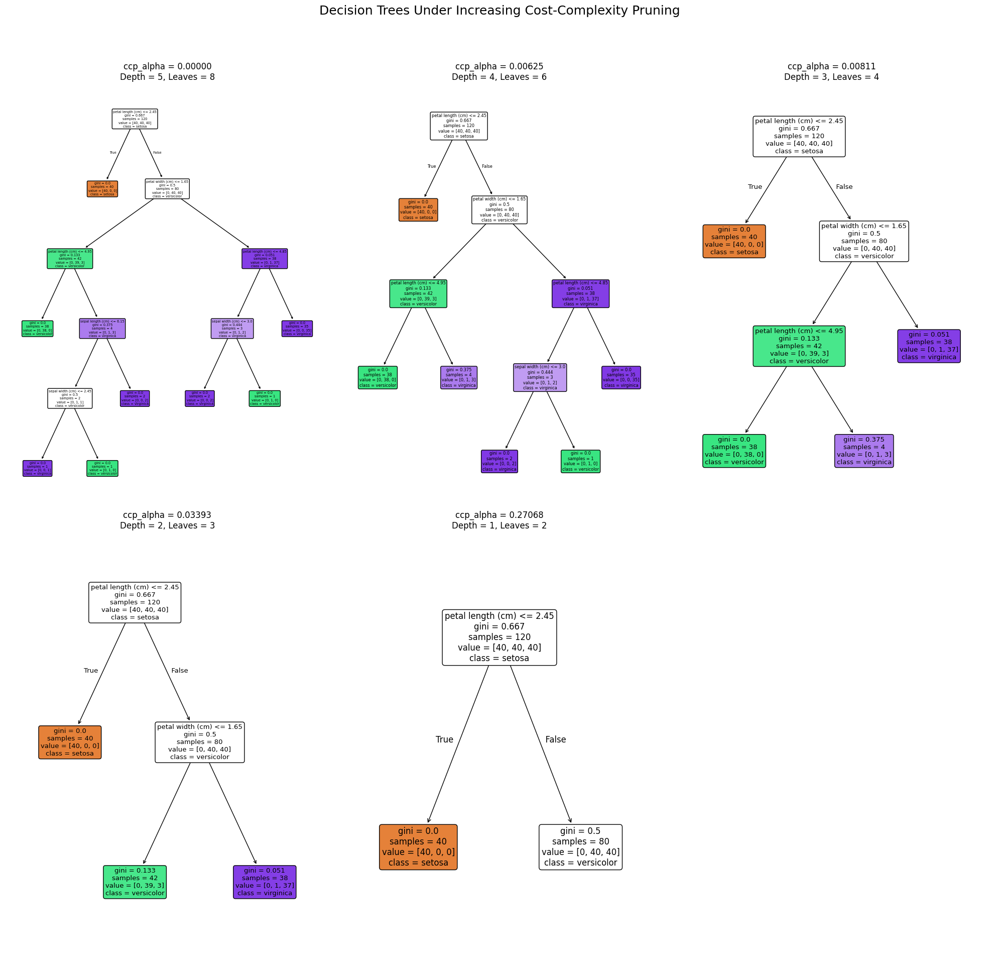

In [ ]:
# -----------------------
# 1. Get pruning path
# -----------------------

base_tree = DecisionTreeClassifier(random_state=42)

path = base_tree.cost_complexity_pruning_path(X_train, y_train)
ccp_alphas = path.ccp_alphas[:-1]  # exclude root-only tree

# -----------------------
# 2. Visualize trees at different pruning strengths
# -----------------------

trees_for_plot = []

for alpha in ccp_alphas:
    tree = DecisionTreeClassifier(
        random_state=42,
        ccp_alpha=alpha
    )
    tree.fit(X_train, y_train)
    trees_for_plot.append(tree)

n_trees_to_plot = min(6, len(trees_for_plot))

indices_to_plot = np.linspace(
    0,
    len(trees_for_plot) - 1,
    n_trees_to_plot,
    dtype=int
)

plt.figure(figsize=(20, 20))

for i, idx in enumerate(indices_to_plot):

    tree = trees_for_plot[idx]

    plt.subplot(2, 3, i + 1)

    plot_tree(
        tree,
        filled=True,
        rounded=True,
        class_names=target_names,
        feature_names=feature_names
    )

    plt.title(
        f"ccp_alpha = {ccp_alphas[idx]:.5f}\n"
        f"Depth = {tree.get_depth()}, Leaves = {tree.get_n_leaves()}"
    )

plt.suptitle(
    "Decision Trees Under Increasing Cost-Complexity Pruning",
    fontsize=18
)

plt.tight_layout(rect=[0, 0.03, 1, 0.95])
plt.show()

Best ccp_alpha: 0.00000
CV accuracy: 0.942 ± 0.020

Pruning results:
   ccp_alpha  CV Accuracy Mean  CV Accuracy SD
0       0.00              0.94            0.02
1       0.01              0.94            0.02
2       0.01              0.94            0.02
3       0.03              0.93            0.03
4       0.27              0.87            0.10


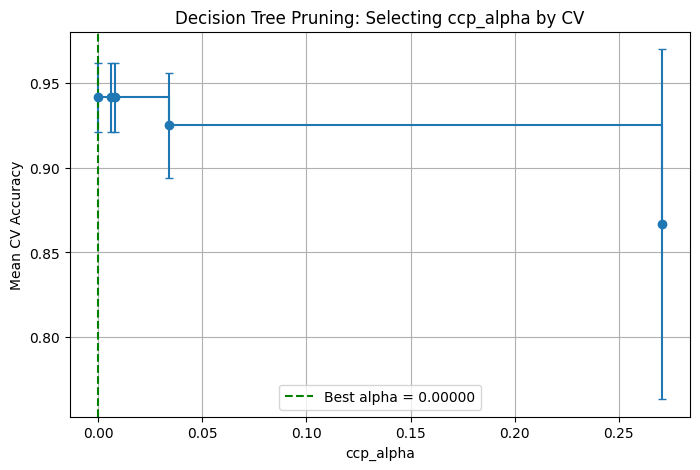

In [ ]:
# -----------------------
# 3. Cross-validate each alpha
# -----------------------

cv_scores_mean = []
cv_scores_sd = []

for alpha in ccp_alphas:

    tree = DecisionTreeClassifier(
        random_state=42,
        ccp_alpha=alpha
    )

    scores = cross_val_score(
        tree,
        X_train,
        y_train,
        cv=5,
        scoring='accuracy'
    )

    cv_scores_mean.append(scores.mean())
    cv_scores_sd.append(scores.std())

# -----------------------
# 4. Select best alpha
# -----------------------

best_idx = np.argmax(cv_scores_mean)
best_alpha = ccp_alphas[best_idx]

print(f"Best ccp_alpha: {best_alpha:.5f}")
print(f"CV accuracy: {cv_scores_mean[best_idx]:.3f} ± {cv_scores_sd[best_idx]:.3f}")

# -----------------------
# 5. Results dataframe
# -----------------------

pruning_results_df = pd.DataFrame({
    "ccp_alpha": ccp_alphas,
    "CV Accuracy Mean": cv_scores_mean,
    "CV Accuracy SD": cv_scores_sd
})

print("\nPruning results:")
print(pruning_results_df)


# -----------------------
# 6. Plot alpha vs CV accuracy
# -----------------------

plt.figure(figsize=(8, 5))

plt.errorbar(
    ccp_alphas,
    cv_scores_mean,
    yerr=cv_scores_sd,
    marker='o',
    capsize=3,
    drawstyle="steps-post"
)

plt.axvline(
    best_alpha,
    linestyle='--',
    label=f"Best alpha = {best_alpha:.5f}",
    color='green'
)

plt.xlabel("ccp_alpha")
plt.ylabel("Mean CV Accuracy")
plt.title("Decision Tree Pruning: Selecting ccp_alpha by CV")
plt.legend()
plt.grid(True)
plt.show()


Test accuracy: 0.933

Classification report:
              precision    recall  f1-score   support

      setosa       1.00      1.00      1.00        10
  versicolor       0.90      0.90      0.90        10
   virginica       0.90      0.90      0.90        10

    accuracy                           0.93        30
   macro avg       0.93      0.93      0.93        30
weighted avg       0.93      0.93      0.93        30



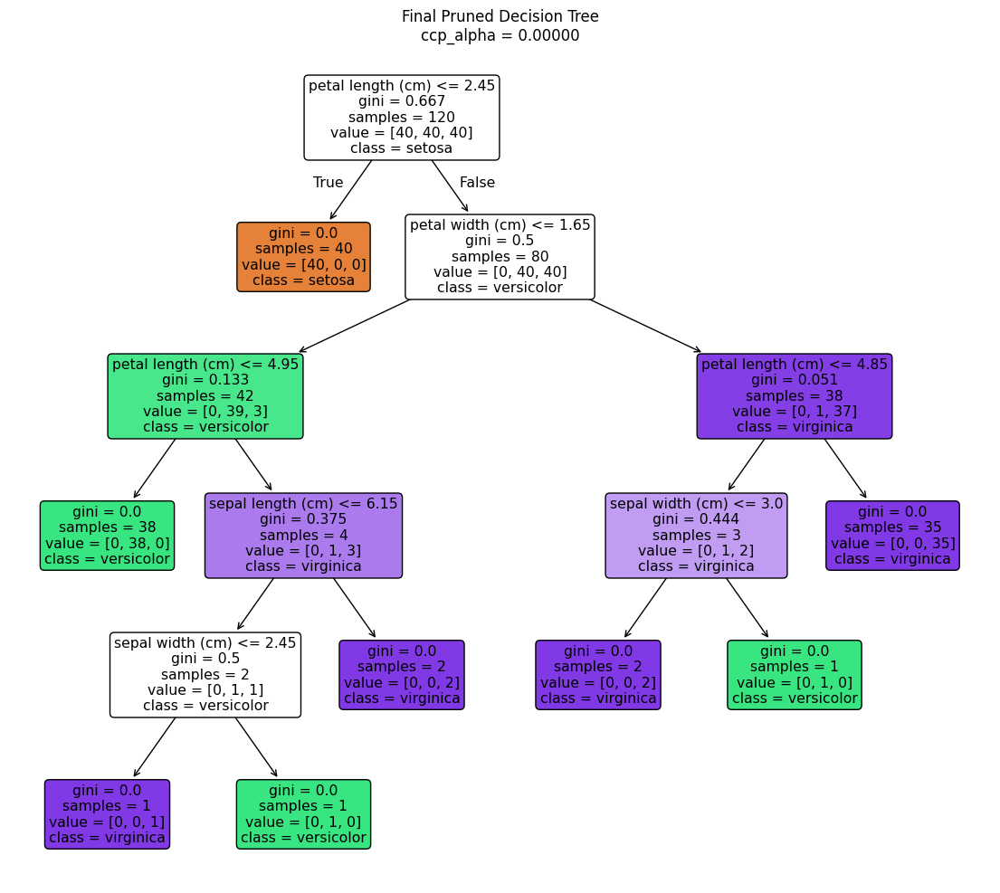

In [ ]:
# -----------------------
# 7. Refit final pruned tree on full training set
# -----------------------

final_tree = DecisionTreeClassifier(
    random_state=42,
    ccp_alpha=best_alpha
)

final_tree.fit(X_train, y_train)

# -----------------------
# 8. Test-set evaluation
# -----------------------

y_pred = final_tree.predict(X_test)

print(f"\nTest accuracy: {accuracy_score(y_test, y_pred):.3f}")

print("\nClassification report:")
print(classification_report(
    y_test,
    y_pred,
    target_names=target_names
))

# -----------------------
# 9. Plot final selected pruned tree
# -----------------------

plt.figure(figsize=(14, 12))

plot_tree(
    final_tree,
    feature_names=feature_names,
    class_names=target_names,
    filled=True,
    rounded=True
)

plt.title(f"Final Pruned Decision Tree\nccp_alpha = {best_alpha:.5f}")
plt.show()

## Gradient Boosting Manual Implementation

In [ ]:
from sklearn.tree import DecisionTreeRegressor

# -----------------------------
# Data generation and plotting
# -----------------------------

def GenerateData():
    X = np.arange(0, 50).reshape(-1, 1)

    y = np.concatenate([
        np.random.uniform(10, 15, 10),
        np.random.uniform(20, 25, 10),
        np.random.uniform(0, 5, 10),
        np.random.uniform(30, 32, 10),
        np.random.uniform(13, 17, 10)
    ])

    return X, y.reshape(-1, 1)

def PlotModel(X, y, yp, title='', fn=None):
    plt.figure(figsize=(20,10))
    plt.scatter(X, y, color='blue', label='True y')
    plt.plot(X, yp, color='red', label='Prediction')
    plt.xlim([-1, 51])
    plt.ylim([-1, 35])
    plt.xlabel('x')
    plt.ylabel('y')
    plt.title(title)
    plt.legend()
    if fn:
        plt.savefig(fn)
    plt.show()

def PlotResidual(X, residuals, title='', fn=None):
    plt.figure(figsize=(20,10))
    plt.scatter(X, residuals, color='green')
    plt.xlim([-1, 51])
    plt.ylim([-25, 25])
    plt.xlabel('x')
    plt.ylabel('residual')
    plt.title(title)
    if fn:
        plt.savefig(fn)
    plt.show()

# -----------------------------
# Gradient Boosting Logic
# -----------------------------

def GradientBoosting(X, y, n_iterations=30, max_depth=1, plot=True):
    # Initial prediction is the mean
    initial_pred = np.ones_like(y) * y.mean()
    prediction = initial_pred.copy()

    if plot:
        PlotModel(X, y, initial_pred, title='Iteration #1 - Initial Mean')
        PlotResidual(X, y - prediction, title='Iteration #1 - Residual')

    for i in range(n_iterations):
        residuals = y - prediction

        stump = DecisionTreeRegressor(max_depth=max_depth)
        stump.fit(X, residuals)
        update = stump.predict(X).reshape(-1, 1)

        prediction += update

        if plot and (i+2)%5==0:
            PlotModel(X, y, prediction, title=f'Iteration #{i+2} - Model')
            PlotResidual(X, y - prediction, title=f'Iteration #{i+2} - Residual')

    return prediction

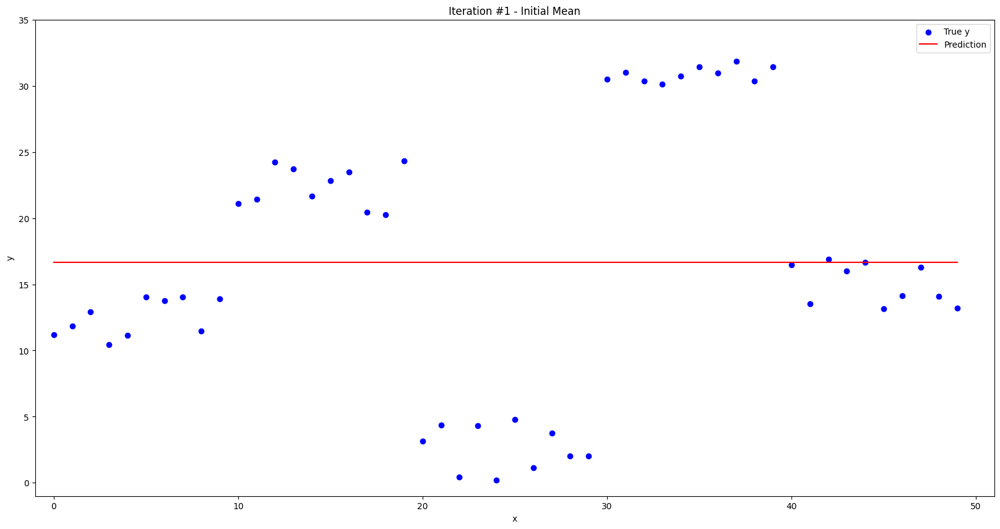

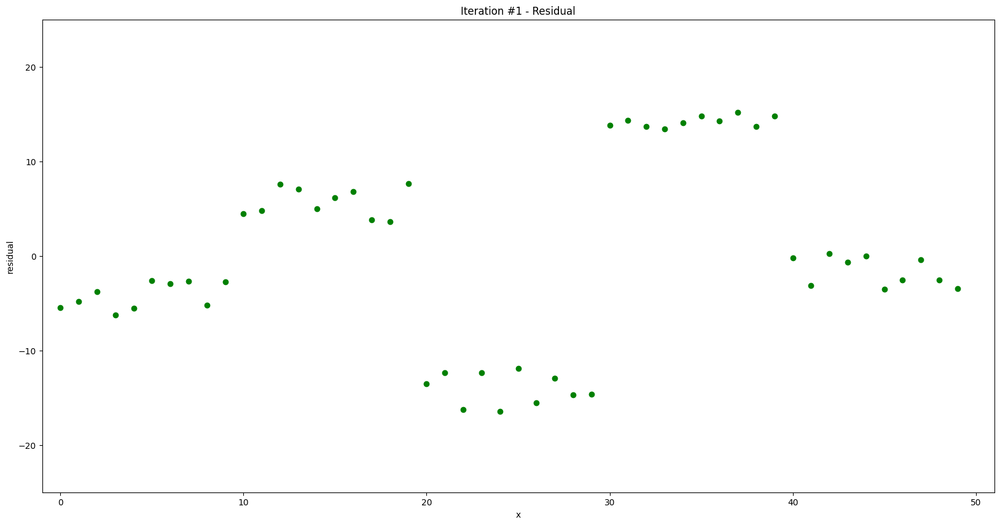

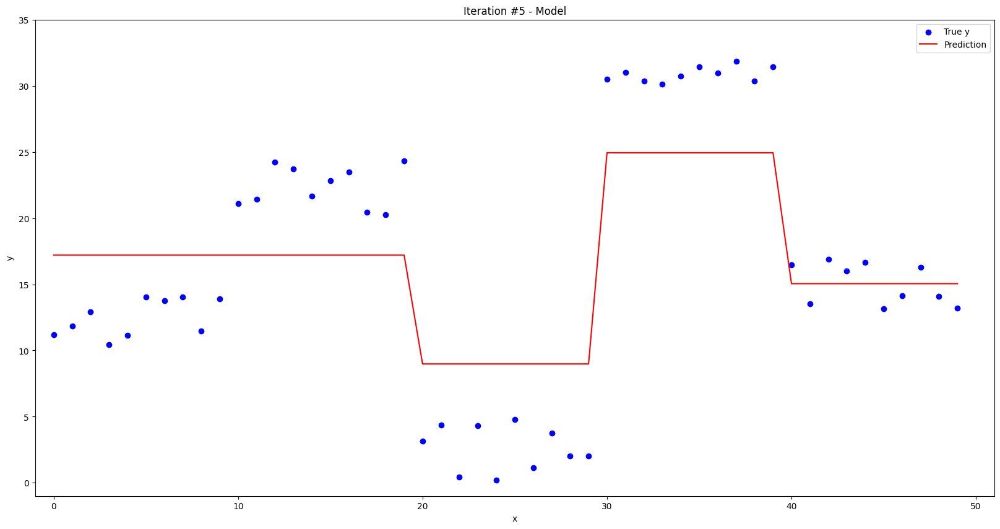

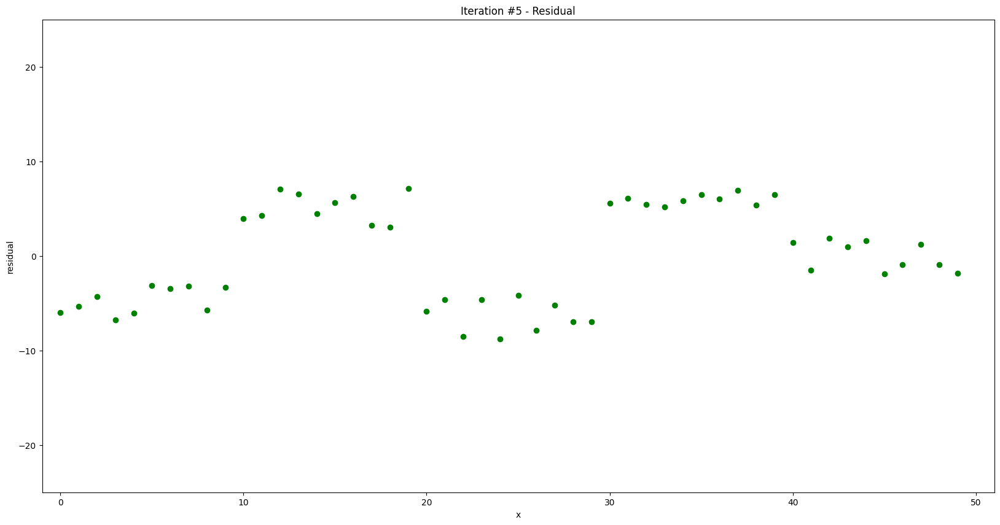

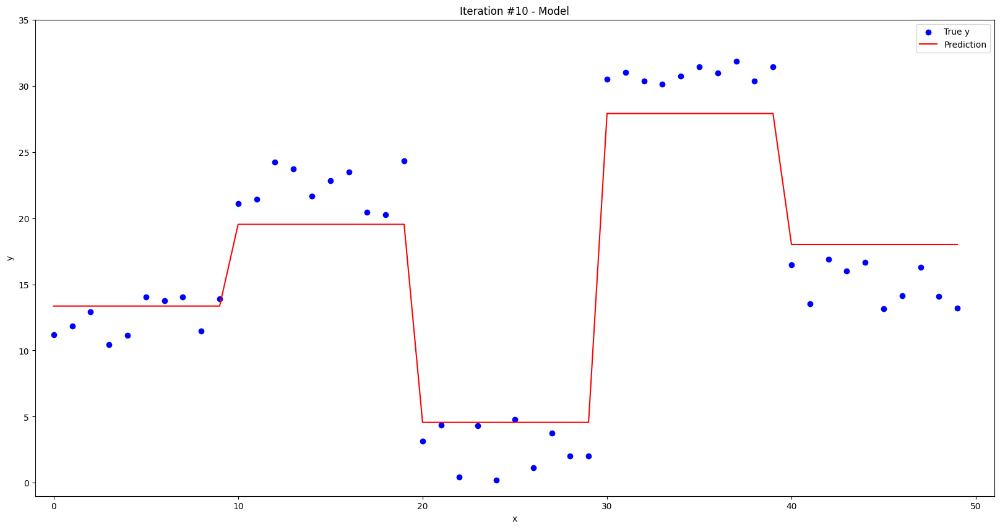

...

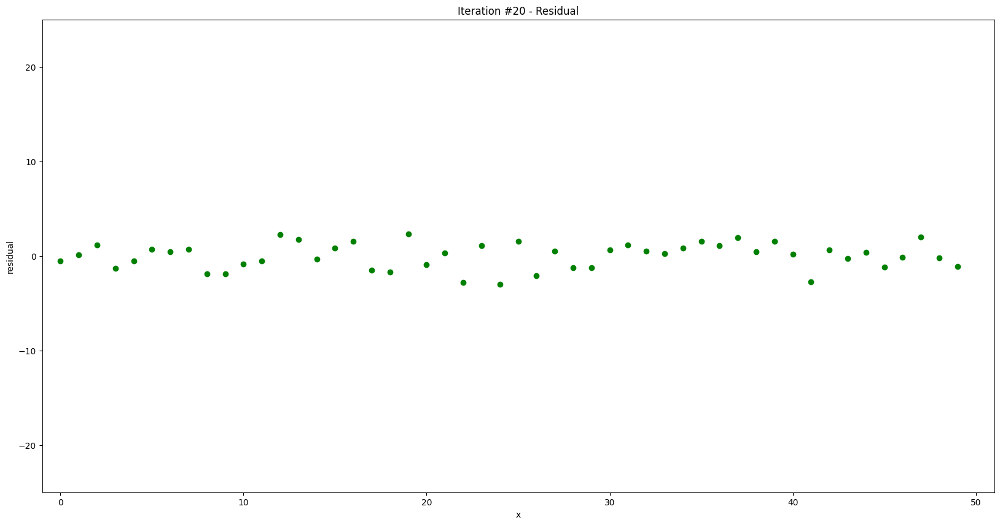

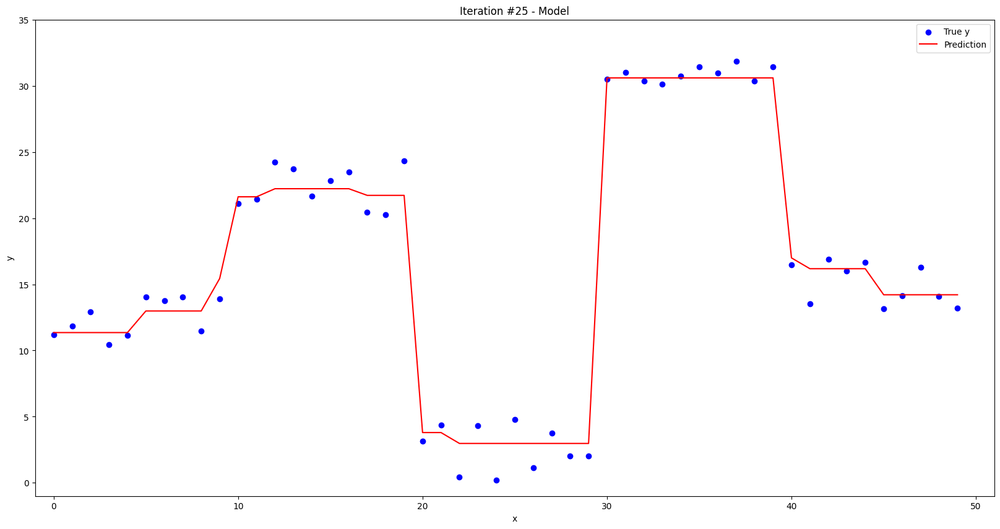

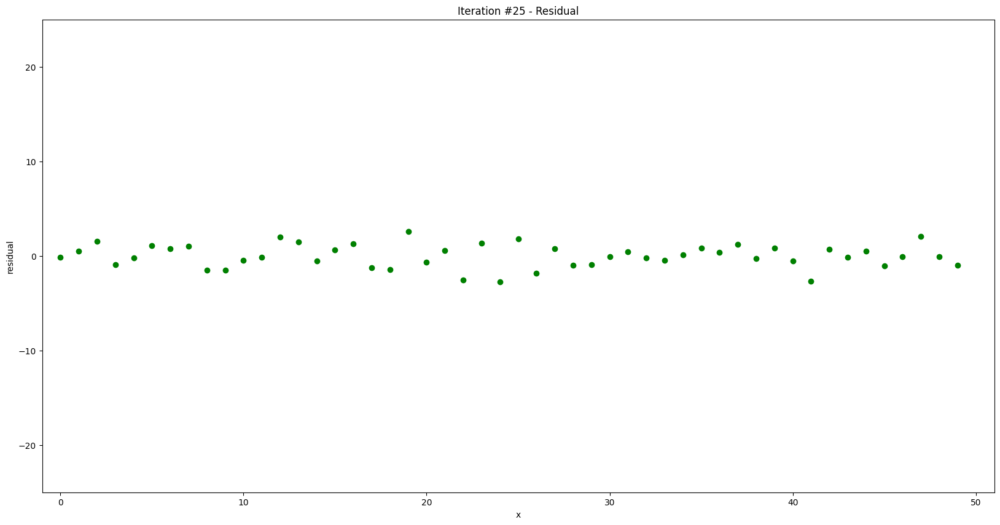

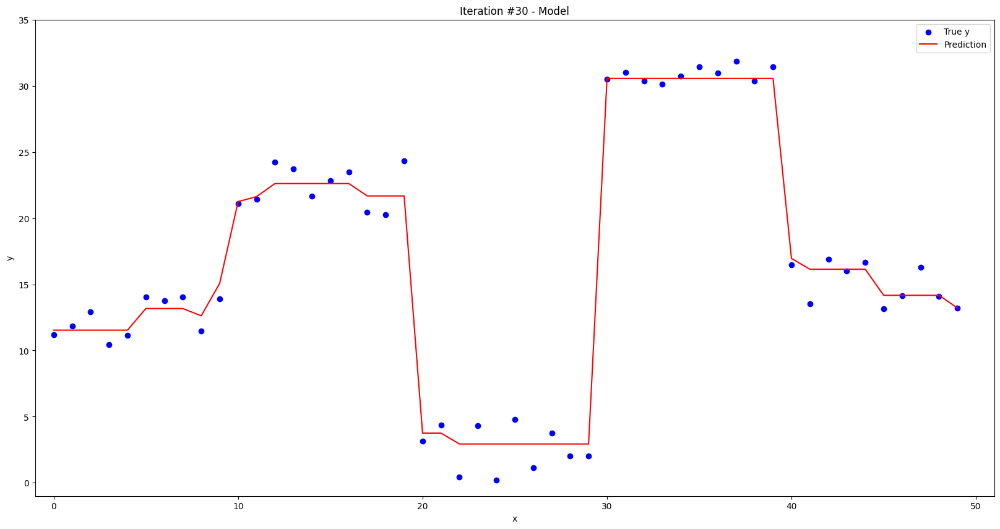

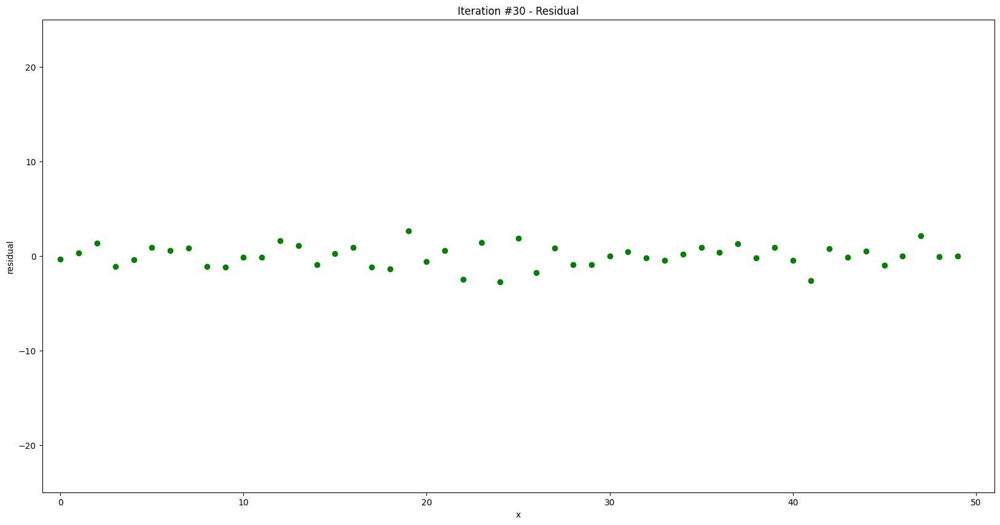

In [ ]:
X, y = GenerateData()
final_prediction = GradientBoosting(X, y, n_iterations=30, max_depth=1, plot=True)

# Feedback

Please leave a feedback on this lab through [this form](https://forms.office.com/e/JLd20PdtGq) (estimated 2 minutes)